# Problema 10.3 — Simulaciones numéricas completas

Este notebook reúne, en orden, todos los desarrollos de los incisos 10.3 (i)–(v).
Cada sección es una copia íntegra de su notebook individual; los archivos originales se
mantienen por separado.

## Contenido

1. **10.3 (i):** sistema de Galerkin truncado a dos modos e integración con RK4.
2. **10.3 (ii):** solución pseudoespectral con FFT y comparación con dos modos.
3. **10.3 (iii):** comparación con el truncamiento de Galerkin a cuatro modos.
4. **10.3 (iv):** variación de $L/(2\pi)$ y clasificación de las trayectorias.
5. **10.3 (v):** exploración de dominios grandes con ETDRK4 y animación.

> Las secciones son autocontenidas. Al ejecutar todo el notebook, cada inciso vuelve a
> definir las funciones y parámetros que necesita. El inciso (v), incluida la generación
> de la animación, es el más costoso computacionalmente.


# Problema 10.3(i): simulación del sistema truncado a dos modos

Integramos el sistema de amplitudes de Kuramoto–Sivashinsky hasta
$$
t_f=4,
$$
con la condición inicial
$$
(a_1(0),a_2(0))=(1,0),
$$
para los valores
$$
\frac{1}{k}=\frac{L}{2\pi}=0.8,\;1.2,\;1.94.
$$


## Sistema de dos modos

Partimos del sistema modal
$$
\dot a_\ell=(1-k^2\ell^2)\ell^2a_\ell
-\frac{1}{2}\sum_{m=1}^{\infty}m a_m
\left[\operatorname{sg}(\ell-m)a_{|\ell-m|}+a_{\ell+m}\right].
$$

Al truncar en dos modos imponemos
$$
a_j=0\qquad \text{para }j>2.
$$

Para el primer modo se obtiene
$$
\dot a_1=(1-k^2)a_1+\frac{1}{2}a_1a_2,
$$
y para el segundo,
$$
\dot a_2=(4-16k^2)a_2-\frac{1}{2}a_1^2.
$$

Para conservar la notación del análisis de puntos fijos, mantenemos
$$
k
$$
como parámetro de las ecuaciones. En el código se ingresan los valores pedidos de
$$
\frac{1}{k}=\frac{L}{2\pi}
$$
y se toma su inversa para obtener el parámetro `k`.

Los puntos fijos obtenidos en el inciso anterior son
$$
P_0=(0,0)
$$
y
$$
P_{\pm}=\left(\pm4\sqrt{(k^2-1)(1-4k^2)},\;2(k^2-1)\right).
$$
El radicando es no negativo para
$$
\frac{1}{2}\leq |k|\leq 1.
$$
Los puntos son distintos del origen en el intervalo estricto. Como en este problema se considera `k > 0` y
$$
k=\frac{2\pi}{L},
$$
esto equivale a
$$
\frac{1}{2}<k<1
\quad\Longleftrightarrow\quad
1<\frac{1}{k}=\frac{L}{2\pi}<2
\quad\Longleftrightarrow\quad
2\pi<L<4\pi.
$$


## Reducción explícita de la suma no lineal

La truncación a dos modos significa que solamente conservamos `a_1` y `a_2`. Por lo tanto,
$$
a_0=0,
\qquad
a_j=0\quad\text{si}\quad j>2.
$$

Para el modo `1`, los únicos aportes posibles de la suma corresponden a `m=1` y `m=2`. El término con `m=1` produce `a_1a_2`, mientras que el término con `m=2` produce `-2a_1a_2`. Entonces,
$$
-\frac{1}{2}\left(a_1a_2-2a_1a_2\right)
=\frac{1}{2}a_1a_2.
$$

Para el modo `2`, solamente sobrevive el producto entre dos amplitudes del primer modo:
$$
-\frac{1}{2}a_1^2.
$$

De esta manera se obtiene el sistema cerrado
$$
\boxed{
\begin{aligned}
\dot a_1&=(1-k^2)a_1+\frac{1}{2}a_1a_2,\\
\dot a_2&=4(1-4k^2)a_2-\frac{1}{2}a_1^2.
\end{aligned}}
$$

Los primeros términos de ambas ecuaciones describen el crecimiento o amortiguamiento lineal de cada modo. Los términos cuadráticos representan el intercambio no lineal entre ellos. En particular, aunque inicialmente `a_2(0)=0`, se cumple
$$
\dot a_2(0)=-\frac{1}{2}a_1(0)^2=-\frac{1}{2},
$$
por lo que el segundo modo aparece inmediatamente y toma valores negativos.

Además, la primera ecuación puede factorizarse como
$$
\dot a_1=a_1\left(1-k^2+\frac{a_2}{2}\right).
$$
Como partimos de `a_1(0)=1`, la trayectoria permanece en el semiplano de amplitud `a_1` positiva. Por eso, cuando existen dos puntos fijos simétricos, la solución se relaciona con la rama positiva `P_+`.


In [1]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({"figure.dpi": 120})


In [2]:
def rhs_dos_modos(a, inverso_k):
    """Derivada temporal para el truncamiento de Galerkin con N=2."""
    a1, a2 = a
    k = 1.0 / inverso_k

    da1 = (1.0 - k**2) * a1 + 0.5 * a1 * a2
    da2 = (4.0 - 16.0 * k**2) * a2 - 0.5 * a1**2

    return np.array([da1, da2], dtype=float)


## Integración temporal

Aplicamos el método clásico de Runge–Kutta de cuarto orden. Para un estado
$$
\mathbf a_n=(a_{1,n},a_{2,n}),
$$
calculamos cuatro estimaciones de la pendiente:
$$
\begin{aligned}
\mathbf K_1&=\mathbf F(\mathbf a_n),\\
\mathbf K_2&=\mathbf F\left(\mathbf a_n+\frac{\Delta t}{2}\mathbf K_1\right),\\
\mathbf K_3&=\mathbf F\left(\mathbf a_n+\frac{\Delta t}{2}\mathbf K_2\right),\\
\mathbf K_4&=\mathbf F\left(\mathbf a_n+\Delta t\,\mathbf K_3\right).
\end{aligned}
$$

El nuevo estado se obtiene mediante el promedio ponderado
$$
\mathbf a_{n+1}=\mathbf a_n+
\frac{\Delta t}{6}\left(\mathbf K_1+2\mathbf K_2+2\mathbf K_3+\mathbf K_4\right).
$$

Tomamos un paso temporal
$$
\Delta t=10^{-3}.
$$
Con este valor se realizan `4000` pasos hasta llegar a `t_f=4`. Para controlar que el resultado no dependa del paso elegido, repetimos el cálculo con
$$
\Delta t=5\times10^{-4}
$$
y comparamos los estados finales. Una diferencia muy pequeña entre ambas integraciones indica convergencia temporal.


In [3]:
def integrar_rk4(inverso_k, tf=4.0, dt=1.0e-3, a0=(1.0, 0.0)):
    """Integra el sistema autónomo mediante RK4."""
    n_steps = int(np.ceil(tf / dt))
    dt = tf / n_steps

    t = np.linspace(0.0, tf, n_steps + 1)
    a = np.empty((n_steps + 1, 2), dtype=float)
    a[0] = a0

    for n in range(n_steps):
        an = a[n]
        k1 = rhs_dos_modos(an, inverso_k)
        k2 = rhs_dos_modos(an + 0.5 * dt * k1, inverso_k)
        k3 = rhs_dos_modos(an + 0.5 * dt * k2, inverso_k)
        k4 = rhs_dos_modos(an + dt * k3, inverso_k)

        a[n + 1] = an + (dt / 6.0) * (k1 + 2*k2 + 2*k3 + k4)

    return t, a


def punto_fijo_positivo(inverso_k):
    """Rama P_+ de los puntos fijos no triviales, cuando es real."""
    k = 1.0 / inverso_k
    radicando = (k**2 - 1.0) * (1.0 - 4.0 * k**2)
    if radicando < 0.0:
        return None
    return np.array([4.0*np.sqrt(radicando), 2.0*(k**2 - 1.0)])


In [4]:
valores_inverso_k = (0.8, 1.2, 1.94)
resultados = {}

print("  1/k      k        a1(4)         a2(4)       error al refinar dt")
for inverso_k in valores_inverso_k:
    t, a = integrar_rk4(inverso_k, dt=1.0e-3)
    _, a_fino = integrar_rk4(inverso_k, dt=5.0e-4)
    error = np.linalg.norm(a[-1] - a_fino[-1], ord=np.inf)
    resultados[inverso_k] = (t, a)
    print(f" {inverso_k:4.2f}  {1/inverso_k:7.5f}  {a[-1,0]: .9f}   {a[-1,1]: .9f}      {error:.3e}")


  1/k      k        a1(4)         a2(4)       error al refinar dt
 0.80  1.25000   0.104313397   -0.000273747      7.966e-16
 1.20  0.83333   2.319668316   -0.365045343      5.773e-15
 1.94  0.51546   0.679143475   -2.239417542      2.709e-14


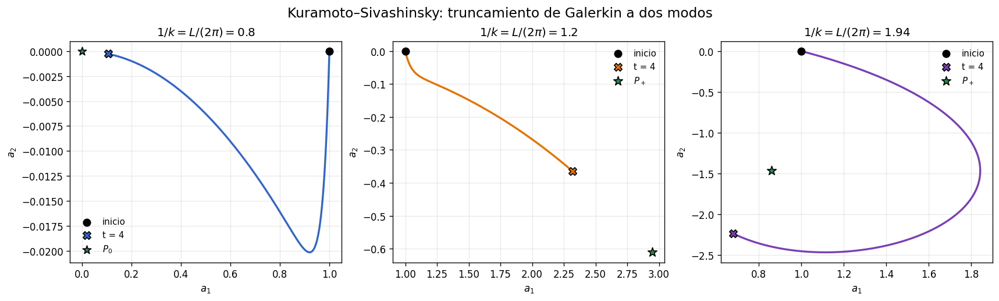

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(14.2, 4.2), constrained_layout=True)
colores = ("#3366CC", "#E67300", "#7B3FB5")

for ax, color, inverso_k in zip(axes, colores, valores_inverso_k):
    _, a = resultados[inverso_k]
    ax.plot(a[:, 0], a[:, 1], color=color, lw=2)
    ax.scatter(*a[0], s=55, color="black", label="inicio", zorder=3)
    ax.scatter(*a[-1], s=65, color=color, edgecolor="black",
               marker="X", label="t = 4", zorder=3)
    punto = punto_fijo_positivo(inverso_k)
    if punto is not None:
        ax.scatter(*punto, s=95, color="#2E8B57", edgecolor="black",
                   marker="*", label=r"$P_+$", zorder=4)
    else:
        ax.scatter(0.0, 0.0, s=80, color="#2E8B57", edgecolor="black",
                   marker="*", label=r"$P_0$", zorder=4)
    ax.set_title(rf"$1/k=L/(2\pi)={inverso_k}$")
    ax.set_xlabel(r"$a_1$")
    ax.set_ylabel(r"$a_2$")
    ax.grid(alpha=0.25)
    ax.legend(frameon=False, fontsize=9)

fig.suptitle("Kuramoto–Sivashinsky: truncamiento de Galerkin a dos modos", fontsize=14)
plt.show()


## Lectura dinámica de los tres casos

La estrella verde indica el punto fijo relevante para la condición inicial elegida. El marcador negro representa el estado inicial y la cruz señala la posición alcanzada en `t=4`.

### Caso `1/k = 0.8`

En este caso `k=1.25`. Los autovalores del origen son
$$
\lambda_1=1-k^2=-0.5625,
\qquad
\lambda_2=4(1-4k^2)=-21.
$$
Ambos son negativos, de modo que el origen `P_0` es estable. La amplitud `a_2` primero se vuelve negativa por el acoplamiento cuadrático, pero luego ambos modos se amortiguan y la trayectoria regresa al origen.

### Caso `1/k = 1.2`

Aquí `k=0.83333`. El origen tiene una dirección inestable porque
$$
\lambda_1=1-k^2>0.
$$
La rama positiva del punto fijo no trivial es aproximadamente
$$
P_+=(2.948111,-0.611111).
$$
Este punto es un nodo estable. La trayectoria avanza hacia él sin oscilar, aunque en `t=4` todavía no lo ha alcanzado completamente.

### Caso `1/k = 1.94`

Ahora `k=0.51546` y la rama positiva está ubicada aproximadamente en
$$
P_+=(0.859049,-1.468594).
$$
En este régimen el punto fijo es una espiral estable. La trayectoria lo sobrepasa y comienza a girar a su alrededor; por eso el estado observado en `t=4` todavía se encuentra alejado de la estrella verde.

La forma cualitativa de las tres trayectorias coincide, por lo tanto, con la clasificación de los puntos fijos obtenida en el inciso analítico.


## Resultados numéricos y convergencia

Los estados obtenidos en el tiempo final son

| `1/k` | `k` | `a_1(4)` | `a_2(4)` |
|---:|---:|---:|---:|
| 0.80 | 1.25000 | 0.104313 | -0.000274 |
| 1.20 | 0.83333 | 2.319668 | -0.365045 |
| 1.94 | 0.51546 | 0.679143 | -2.239418 |

Al repetir el cálculo con la mitad del paso temporal, las diferencias son del orden de
$$
10^{-14},
$$
por lo que los resultados están convergidos respecto de la discretización temporal utilizada. Así, las diferencias entre los tres retratos de fase provienen de la dinámica del sistema y no de un error temporal apreciable.



---

# 10.3 (ii) — Método pseudoespectral y comparación

**Notebook de origen:** `10_3_ii_pseudoespectral.ipynb`

---


# Problema 10.3(ii): integración pseudoespectral

Resolvemos numéricamente la ecuación de Kuramoto–Sivashinsky reescalada en el dominio periódico
$$
0\leq x<2\pi,
$$
$$
\frac{\partial u}{\partial t}
=-\frac{\partial^2u}{\partial x^2}
-k^2\frac{\partial^4u}{\partial x^4}
-u\frac{\partial u}{\partial x},
$$
con condición inicial
$$
u(0,x)=-\sin(x)
$$
y para
$$
\frac{1}{k}=\frac{L}{2\pi}=0.8,\;1.2,\;1.94.
$$

Finalmente extraemos las amplitudes `a_1` y `a_2` de la solución completa y las comparamos con el truncamiento de Galerkin a dos modos del inciso 10.3(i).

## Observación sobre el signo inicial

En el inciso 10.3(i) se pidió
$$
(a_1(0),a_2(0))=(1,0),
$$
mientras que la condición inicial de este inciso implica
$$
(a_1(0),a_2(0))=(-1,0).
$$
Para realizar una comparación directa, integraremos el sistema de dos modos con `a_1(0)=-1`. El sistema es simétrico ante
$$
a_1\longrightarrow-a_1,
\qquad
a_2\longrightarrow a_2,
$$
por lo que esto solamente refleja respecto del eje `a_2` la trayectoria obtenida en el inciso anterior.


## Formulación pseudoespectral

Usamos la identidad
$$
u\,u_x=\frac{1}{2}\frac{\partial}{\partial x}(u^2).
$$
Si `q` denota un número de onda entero, la transformada de Fourier de la ecuación satisface
$$
\frac{d\widehat u_q}{dt}
=\underbrace{\left(q^2-k^2q^4\right)\widehat u_q}_{\text{parte lineal}}
-\underbrace{\frac{iq}{2}\widehat{u^2}_q}_{\text{parte no lineal}}.
$$

El método alterna entre ambos espacios:

1. Los coeficientes `u_hat` representan el campo en Fourier.
2. Una FFT inversa reconstruye `u(x)`.
3. El producto `u^2` se calcula en espacio físico.
4. Una FFT devuelve el producto al espacio espectral.
5. Los modos altos del producto se eliminan mediante la regla de los dos tercios.

La cuarta derivada vuelve rígida la parte lineal. Siguiendo el apunte de la materia usamos RK2 explícito de Heun para toda la derivada temporal. Como este método no integra exactamente la parte rígida, debemos elegir un paso suficientemente pequeño.

Es importante distinguir las dos decisiones numéricas que se comparan:
$$
\text{Galerkin de dos modos}
+\text{RK4 clásico para el tiempo},
$$
$$
\text{PDE pseudoespectral}
+\text{RK2 de Heun para el tiempo}.
$$
RK4 y RK2 son integradores temporales explícitos distintos. RK4 utiliza cuatro evaluaciones por paso y es de orden cuatro; Heun utiliza dos evaluaciones y es de orden dos. La elección de RK2 reproduce exactamente la receta presentada en los apuntes de métodos espectrales.

Tomaremos
$$
N_x=32,
\qquad
\Delta t=10^{-4},
\qquad
t_f=4.
$$
Después repetiremos el cálculo con el mismo número de puntos y la mitad del paso para comprobar convergencia temporal.


## Derivación detallada del sistema espectral

En una grilla periódica escribimos el campo como una suma de modos complejos:
$$
u(x,t)=\sum_q \widehat u_q(t)e^{iqx}.
$$
Cada derivada espacial actúa de manera diagonal sobre esta base:
$$
\widehat{\partial_xu}_q=iq\widehat u_q,
$$
$$
\widehat{\partial_x^2u}_q=-q^2\widehat u_q,
$$
$$
\widehat{\partial_x^4u}_q=q^4\widehat u_q.
$$
Por eso, los dos términos lineales producen
$$
-\widehat{u_{xx}}_q-k^2\widehat{u_{xxxx}}_q
=\left(q^2-k^2q^4\right)\widehat u_q.
$$
El factor
$$
\lambda_q=q^2-k^2q^4
$$
es exactamente la tasa de crecimiento lineal del modo `q`. Los modos con tasa positiva crecen inicialmente, mientras que la cuarta derivada amortigua con mucha intensidad los números de onda altos.

El producto no lineal no es diagonal en Fourier. Calcularlo mediante una convolución explícita sería costoso, de modo que usamos el procedimiento pseudoespectral:

1. Partimos de los coeficientes `u_hat`.
2. Reconstruimos `u` con `ifft`.
3. Formamos el producto puntual `u*u`.
4. Calculamos su transformada con `fft`.
5. Multiplicamos por `-0.5j*q` para obtener el término no lineal.

Este último factor proviene de
$$
-u\,u_x=-\frac{1}{2}\partial_x(u^2)
$$
y, por lo tanto,
$$
\widehat{-u\,u_x}_q=-\frac{iq}{2}\widehat{u^2}_q.
$$

La media espacial está representada por el modo `q=0`. Como la condición inicial tiene media nula y la ecuación conserva esa cantidad, imponemos numéricamente
$$
\widehat u_0(t)=0.
$$
Esto evita que pequeños errores de redondeo generen una deriva artificial del valor medio.

Finalmente, la simetría usada para comparar con el inciso anterior puede comprobarse directamente. Si se reemplaza
$$
a_1\longrightarrow-a_1
$$
en el sistema de dos modos, la ecuación de `a_1` cambia de signo mientras que la ecuación de `a_2` permanece igual, porque depende de `a_1^2`. Por eso las soluciones iniciadas en `a_1=1` y `a_1=-1` son imágenes especulares respecto del eje `a_2`.


In [15]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({"figure.dpi": 120})


## Sistema de referencia con dos modos

Para comparar con la PDE completa integramos nuevamente
$$
\dot a_1=(1-k^2)a_1+\frac{1}{2}a_1a_2,
$$
$$
\dot a_2=4(1-4k^2)a_2-\frac{1}{2}a_1^2,
$$
pero ahora usando la condición inicial correspondiente a `-sin(x)`.


In [16]:
def rhs_dos_modos(a, inverso_k):
    a1, a2 = a
    k = 1.0 / inverso_k
    return np.array([
        (1.0 - k**2) * a1 + 0.5 * a1 * a2,
        4.0 * (1.0 - 4.0 * k**2) * a2 - 0.5 * a1**2,
    ])


def integrar_modal(inverso_k, tf=4.0, dt=1e-3, a0=(-1.0, 0.0)):
    n_steps = int(np.ceil(tf / dt))
    dt = tf / n_steps
    t = np.linspace(0.0, tf, n_steps + 1)
    a = np.empty((n_steps + 1, 2))
    a[0] = a0

    for n in range(n_steps):
        an = a[n]
        k1 = rhs_dos_modos(an, inverso_k)
        k2 = rhs_dos_modos(an + 0.5*dt*k1, inverso_k)
        k3 = rhs_dos_modos(an + 0.5*dt*k2, inverso_k)
        k4 = rhs_dos_modos(an + dt*k3, inverso_k)
        a[n + 1] = an + dt*(k1 + 2*k2 + 2*k3 + k4)/6.0

    return t, a


## Integrador de la PDE

La máscara de de-aliasing conserva solamente los modos que cumplen
$$
|q|\leq\frac{N_x}{3}.
$$
Esto evita que los armónicos altos generados por el producto cuadrático reaparezcan falsamente como modos bajos.

Con la convención usada por `numpy.fft`, las amplitudes de la expansión
$$
u(x,t)=\sum_{n=1}^{\infty}a_n(t)\sin(nx)
$$
se recuperan mediante
$$
a_n(t)=-\frac{2}{N_x}\operatorname{Im}\left(\widehat u_n(t)\right).
$$


In [17]:
def paso_rk2_heun(X, dX_dt, dt):
    """Método RK2 de Heun usado en el apunte de métodos espectrales."""
    k1 = dX_dt(X)
    k2 = dX_dt(X + dt*k1)
    return X + 0.5*dt*(k1 + k2)


def integrar_pseudoespectral(inverso_k, Nx=32, tf=4.0, dt=1e-4):
    k = 1.0 / inverso_k
    x = 2.0*np.pi*np.arange(Nx)/Nx
    modos = np.fft.fftfreq(Nx, d=1.0/Nx)
    lineal = modos**2 - k**2*modos**4
    mascara = np.abs(modos) <= Nx/3.0

    n_steps = int(np.ceil(tf/dt))
    dt = tf/n_steps
    t = np.linspace(0.0, tf, n_steps + 1)
    def derivada_temporal(v):
        u = np.fft.ifft(v).real
        cuadrado_fft = np.fft.fft(u*u)
        cuadrado_fft[~mascara] = 0.0
        return lineal*v - 0.5j*modos*cuadrado_fft

    v = np.fft.fft(-np.sin(x))
    historia = np.empty((n_steps + 1, Nx), dtype=np.complex128)
    historia[0] = v

    for n in range(n_steps):
        v = paso_rk2_heun(v, derivada_temporal, dt)
        v[~mascara] = 0.0
        v[0] = 0.0
        historia[n + 1] = v

    u = np.fft.ifft(historia, axis=1).real
    return t, x, u, historia


def extraer_amplitudes_seno(historia_fft, cantidad=2):
    Nx = historia_fft.shape[1]
    return -2.0*historia_fft[:, 1:cantidad + 1].imag/Nx


In [18]:
valores_inverso_k = (0.8, 1.2, 1.94)
resultados = {}

print("Comparación en t=4: pseudoespectral vs. truncamiento de dos modos")
print(" 1/k   a1_PDE       a2_PDE       a1_2modos    a2_2modos")

for inverso_k in valores_inverso_k:
    t, x, u, historia_fft = integrar_pseudoespectral(inverso_k)
    amplitudes = extraer_amplitudes_seno(historia_fft)
    tm, modal = integrar_modal(inverso_k)
    resultados[inverso_k] = (t, x, u, amplitudes, tm, modal)
    print(
        f"{inverso_k:4.2f}  {amplitudes[-1,0]: .9f}  {amplitudes[-1,1]: .9f}  "
        f"{modal[-1,0]: .9f}  {modal[-1,1]: .9f}"
    )


Comparación en t=4: pseudoespectral vs. truncamiento de dos modos
 1/k   a1_PDE       a2_PDE       a1_2modos    a2_2modos
0.80  -0.104313550  -0.000273746  -0.104313397  -0.000273747
1.20  -2.324320669  -0.358373187  -2.319668316  -0.365045343
1.94  -0.970326681  -1.590151174  -0.679143475  -2.239417542


## Control de convergencia

Repetimos cada simulación usando la misma grilla y la mitad del paso temporal:
$$
N_x=32,
\qquad
\Delta t=5\times10^{-5}.
$$
Comparamos las amplitudes finales con las obtenidas usando el paso base. Medimos el máximo error entre `a_1` y `a_2`.


In [19]:
print(" 1/k   error_inf en (a1,a2) al t=4")
errores_convergencia = {}

for inverso_k in valores_inverso_k:
    _, _, _, historia_fina = integrar_pseudoespectral(
        inverso_k, Nx=32, dt=5e-5
    )
    amplitudes_finas = extraer_amplitudes_seno(historia_fina)[-1]
    amplitudes_base = resultados[inverso_k][3][-1]
    error = np.linalg.norm(amplitudes_finas - amplitudes_base, ord=np.inf)
    errores_convergencia[inverso_k] = error
    print(f"{inverso_k:4.2f}   {error:.3e}")


 1/k   error_inf en (a1,a2) al t=4
0.80   9.416e-11
1.20   1.097e-10
1.94   1.087e-09


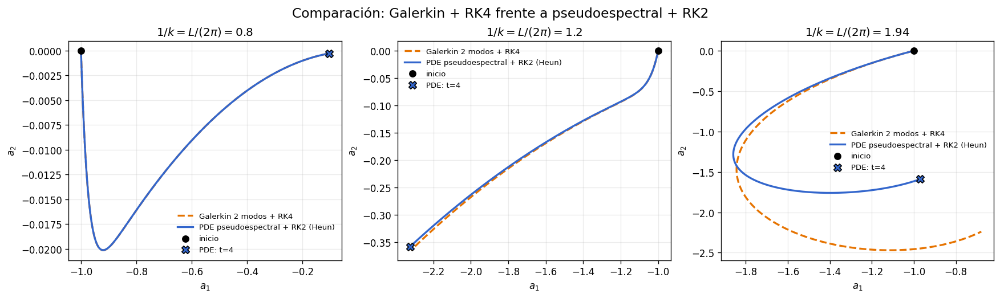

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(14.5, 4.25), constrained_layout=True)

for ax, inverso_k in zip(axes, valores_inverso_k):
    _, _, _, amplitudes, _, modal = resultados[inverso_k]
    ax.plot(modal[:, 0], modal[:, 1], "--", color="#E67300", lw=2,
            label="Galerkin 2 modos + RK4")
    ax.plot(amplitudes[:, 0], amplitudes[:, 1], color="#3366CC", lw=2,
            label="PDE pseudoespectral + RK2 (Heun)")
    ax.scatter(-1.0, 0.0, color="black", s=45, zorder=4, label="inicio")
    ax.scatter(*amplitudes[-1], color="#3366CC", edgecolor="black",
               marker="X", s=65, zorder=4, label="PDE: t=4")
    ax.set_title(rf"$1/k=L/(2\pi)={inverso_k}$")
    ax.set_xlabel(r"$a_1$")
    ax.set_ylabel(r"$a_2$")
    ax.grid(alpha=0.25)
    ax.legend(frameon=False, fontsize=8)

fig.suptitle("Comparación: Galerkin + RK4 frente a pseudoespectral + RK2", fontsize=14)
plt.show()


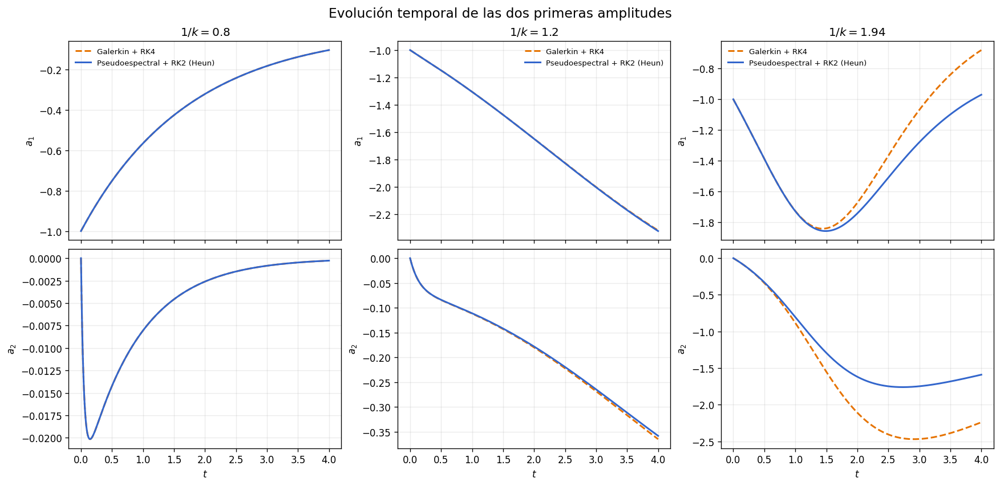

In [21]:
fig, axes = plt.subplots(2, 3, figsize=(14.5, 7.0), sharex="col", constrained_layout=True)

for j, inverso_k in enumerate(valores_inverso_k):
    t, _, _, amplitudes, tm, modal = resultados[inverso_k]
    for i, etiqueta in enumerate((r"$a_1$", r"$a_2$")):
        axes[i, j].plot(tm, modal[:, i], "--", color="#E67300", lw=1.8,
                        label="Galerkin + RK4")
        axes[i, j].plot(t, amplitudes[:, i], color="#3366CC", lw=1.8,
                        label="Pseudoespectral + RK2 (Heun)")
        axes[i, j].set_ylabel(etiqueta)
        axes[i, j].grid(alpha=0.25)
    axes[0, j].set_title(rf"$1/k={inverso_k}$")
    axes[1, j].set_xlabel(r"$t$")
    axes[0, j].legend(frameon=False, fontsize=8)

fig.suptitle("Evolución temporal de las dos primeras amplitudes", fontsize=14)
plt.show()


## Comparación de resultados

### Caso `1/k = 0.8`

Las curvas pseudoespectral y de dos modos son prácticamente indistinguibles. El estado trivial es estable y los modos superiores generados por la no linealidad permanecen muy pequeños. En consecuencia, el truncamiento a dos modos describe correctamente la dinámica.

La coincidencia no significa que RK4 y RK2 sean el mismo algoritmo: significa que, para este régimen, ambos integradores resuelven correctamente dos modelos espaciales cuya dinámica dominante es casi la misma.

### Caso `1/k = 1.2`

Ambas trayectorias continúan siendo muy cercanas. Aparece una diferencia pequeña porque la PDE permite transferir amplitud hacia `a_3`, `a_4` y modos superiores, mientras que el modelo reducido fuerza esas amplitudes a cero.

### Caso `1/k = 1.94`

La diferencia es clara. Los dos modelos coinciden durante la etapa inicial, pero luego los modos superiores modifican la evolución de `a_1` y `a_2`. El truncamiento de Galerkin a dos modos ya no representa cuantitativamente la PDE completa para este tamaño de dominio.

Los errores de refinamiento son menores que
$$
2\times10^{-9},
$$
de modo que la separación observada en el último caso no es un artefacto de la grilla o del paso temporal: es el efecto físico de los modos omitidos por el truncamiento.



---

# 10.3 (iii) — Truncamiento a cuatro modos

**Notebook de origen:** `10_3_iii_cuatro_modos.ipynb`

---


# Problema 10.3(iii): truncamiento a cuatro modos

En este inciso repetimos la comparación entre el modelo de Galerkin y la ecuación completa, pero conservando ahora cuatro amplitudes:
$$
u(x,t)\approx\sum_{n=1}^{4}a_n(t)\sin(nx).
$$

La condición inicial continúa siendo
$$
u(0,x)=-\sin(x),
$$
por lo que
$$
(a_1(0),a_2(0),a_3(0),a_4(0))=(-1,0,0,0).
$$

## Parámetros utilizados

El enunciado escrito pide estudiar
$$
\frac{1}{k}=\frac{L}{2\pi}=2.5.
$$
En la pizarra de clase se recomendó también el conjunto
$$
\frac{1}{k}=1.94,
\qquad
t_f=20,
\qquad
N_x=32.
$$

Para no reemplazar una indicación por la otra, usamos `2.5` como resultado principal y reproducimos el caso de la pizarra como control numérico. En ambos casos integramos hasta `t_f=20`, porque este tiempo permite observar el comportamiento asintótico con claridad.


## Sistema modal de cuatro amplitudes

Partimos de la ecuación modal general
$$
\dot a_\ell
=(1-k^2\ell^2)\ell^2a_\ell
-\frac{1}{2}\sum_{m=1}^{\infty}m a_m
\left[\operatorname{sg}(\ell-m)a_{|\ell-m|}+a_{\ell+m}\right].
$$
Al truncar en cuatro modos imponemos
$$
a_j=0
\qquad\text{para}\qquad
j>4.
$$
Evaluando la suma para cada valor de `ell`, obtenemos
$$
\boxed{
\begin{aligned}
\dot a_1={}&(1-k^2)a_1
+\frac{1}{2}\left(a_1a_2+a_2a_3+a_3a_4\right),\\
\dot a_2={}&4(1-4k^2)a_2
-\frac{1}{2}a_1^2+a_1a_3+a_2a_4,\\
\dot a_3={}&9(1-9k^2)a_3
-\frac{3}{2}a_1a_2+\frac{3}{2}a_1a_4,\\
\dot a_4={}&16(1-16k^2)a_4
-2a_1a_3-a_2^2.
\end{aligned}}
$$

Los modos adicionales permiten representar transferencias de amplitud que el modelo de dos modos descartaba. En particular, `a_3` es generado por el producto `a_1a_2`, mientras que `a_4` recibe contribuciones de `a_1a_3` y `a_2^2`.


In [1]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({"figure.dpi": 120})


In [2]:
def rhs_cuatro_modos(a, inverso_k):
    a1, a2, a3, a4 = a
    k = 1.0/inverso_k
    return np.array([
        (1.0-k**2)*a1 + 0.5*(a1*a2 + a2*a3 + a3*a4),
        4.0*(1.0-4.0*k**2)*a2 - 0.5*a1**2 + a1*a3 + a2*a4,
        9.0*(1.0-9.0*k**2)*a3 - 1.5*a1*a2 + 1.5*a1*a4,
        16.0*(1.0-16.0*k**2)*a4 - 2.0*a1*a3 - a2**2,
    ])


def integrar_modal_4(inverso_k, tf=20.0, dt=1e-3,
                      a0=(-1.0, 0.0, 0.0, 0.0)):
    n_steps = int(np.ceil(tf/dt))
    dt = tf/n_steps
    t = np.linspace(0.0, tf, n_steps + 1)
    a = np.empty((n_steps + 1, 4))
    a[0] = a0

    for n in range(n_steps):
        an = a[n]
        k1 = rhs_cuatro_modos(an, inverso_k)
        k2 = rhs_cuatro_modos(an + 0.5*dt*k1, inverso_k)
        k3 = rhs_cuatro_modos(an + 0.5*dt*k2, inverso_k)
        k4 = rhs_cuatro_modos(an + dt*k3, inverso_k)
        a[n + 1] = an + dt*(k1 + 2*k2 + 2*k3 + k4)/6.0

    return t, a


## Solución pseudoespectral de referencia

Para la PDE completa reutilizamos el método del inciso anterior:

- FFT en una grilla periódica.
- Regla de los dos tercios para eliminar aliasing.
- RK2 explícito de Heun para avanzar toda la ecuación en el tiempo.
- Extracción de las cuatro primeras amplitudes mediante
$$
a_n(t)=-\frac{2}{N_x}\operatorname{Im}\left(\widehat u_n(t)\right).
$$

Usamos `N_x=32` en ambos casos, siguiendo la resolución recomendada en la pizarra.

En los gráficos se indican ahora las dos partes de cada método:
$$
\text{Galerkin de cuatro modos}+\text{RK4 clásico},
$$
$$
\text{PDE pseudoespectral}+\text{RK2 de Heun}.
$$
Galerkin y pseudoespectral determinan cómo se aproxima la dependencia espacial. RK4 y RK2 determinan cómo se avanza en el tiempo. RK4 utiliza cuatro pendientes y es de orden cuatro; Heun utiliza dos pendientes y es de orden dos. Esta segunda combinación es la que aparece en el apunte de la materia.


In [3]:
def paso_rk2_heun(X, dX_dt, dt):
    """RK2 de Heun, siguiendo la implementación del apunte."""
    k1 = dX_dt(X)
    k2 = dX_dt(X + dt*k1)
    return X + 0.5*dt*(k1 + k2)


def integrar_pseudoespectral(inverso_k, Nx=32, tf=20.0, dt=5e-4):
    k = 1.0/inverso_k
    x = 2.0*np.pi*np.arange(Nx)/Nx
    modos = np.fft.fftfreq(Nx, d=1.0/Nx)
    lineal = modos**2-k**2*modos**4
    mascara = np.abs(modos) <= Nx/3.0
    n_steps = int(np.ceil(tf/dt))
    dt = tf/n_steps
    t = np.linspace(0.0, tf, n_steps + 1)
    def derivada_temporal(v):
        u = np.fft.ifft(v).real
        producto = np.fft.fft(u*u)
        producto[~mascara] = 0.0
        return lineal*v - 0.5j*modos*producto

    v = np.fft.fft(-np.sin(x))
    historia = np.empty((n_steps + 1, Nx), dtype=np.complex128)
    historia[0] = v
    for n in range(n_steps):
        v = paso_rk2_heun(v, derivada_temporal, dt)
        v[~mascara] = 0.0
        v[0] = 0.0
        historia[n + 1] = v

    u = np.fft.ifft(historia, axis=1).real
    return t, x, u, historia


def extraer_amplitudes(historia_fft, cantidad=4):
    Nx = historia_fft.shape[1]
    return -2.0*historia_fft[:, 1:cantidad + 1].imag/Nx


In [4]:
casos = {
    "enunciado": {"inverso_k": 2.5, "Nx": 32},
    "pizarra": {"inverso_k": 1.94, "Nx": 32},
}
resultados = {}

for nombre, parametros in casos.items():
    inverso_k = parametros["inverso_k"]
    Nx = parametros["Nx"]
    t, x, u, historia = integrar_pseudoespectral(inverso_k, Nx=Nx)
    amplitudes = extraer_amplitudes(historia, 4)
    tm, modal = integrar_modal_4(inverso_k)
    resultados[nombre] = (t, x, u, amplitudes, tm, modal)

    print(f"{nombre}: 1/k={inverso_k}, Nx={Nx}")
    print("  PDE:    ", np.array2string(amplitudes[-1], precision=8))
    print("  4 modos:", np.array2string(modal[-1], precision=8))


enunciado: 1/k=2.5, Nx=32
  PDE:     [-1.01464878e-17 -6.07580012e+00 -1.54235943e-17 -1.40542608e+00]
  4 modos: [ 2.24009093e-25 -5.99519808e+00 -5.01930494e-25 -1.44000000e+00]
pizarra: 1/k=1.94, Nx=32
  PDE:     [-1.02815708 -1.27193676 -0.15140002 -0.03688729]
  4 modos: [-1.02817582 -1.27151296 -0.15195886 -0.03707986]


## Control de convergencia

Para ambos casos repetimos la PDE con la misma grilla y la mitad del paso temporal:
$$
N_x=32,
\qquad
\Delta t=2.5\times10^{-4}.
$$


In [5]:
_, _, _, historia_fina = integrar_pseudoespectral(
    2.5, Nx=32, tf=20.0, dt=2.5e-4
)
fino_25 = extraer_amplitudes(historia_fina, 4)[-1]
base_25 = resultados["enunciado"][3][-1]
error_25 = np.linalg.norm(fino_25-base_25, ord=np.inf)

_, _, _, historia_fina_pizarra = integrar_pseudoespectral(
    1.94, Nx=32, tf=20.0, dt=2.5e-4
)
fino_194 = extraer_amplitudes(historia_fina_pizarra, 4)[-1]
base_194 = resultados["pizarra"][3][-1]
error_194 = np.linalg.norm(fino_194-base_194, ord=np.inf)

print(f"Error para 1/k=2.5:  {error_25:.3e}")
print(f"Error para 1/k=1.94: {error_194:.3e}")


Error para 1/k=2.5:  2.593e-13
Error para 1/k=1.94: 1.486e-09


## Trayectoria tridimensional

La consigna sugiere representar tres amplitudes. Graficamos el espacio
$$
(a_1,a_2,a_3)
$$
para el modelo de cuatro modos y para la PDE completa. Ambas trayectorias parten de
$$
(-1,0,0)
$$
y evolucionan hacia un estado dominado por los modos pares.


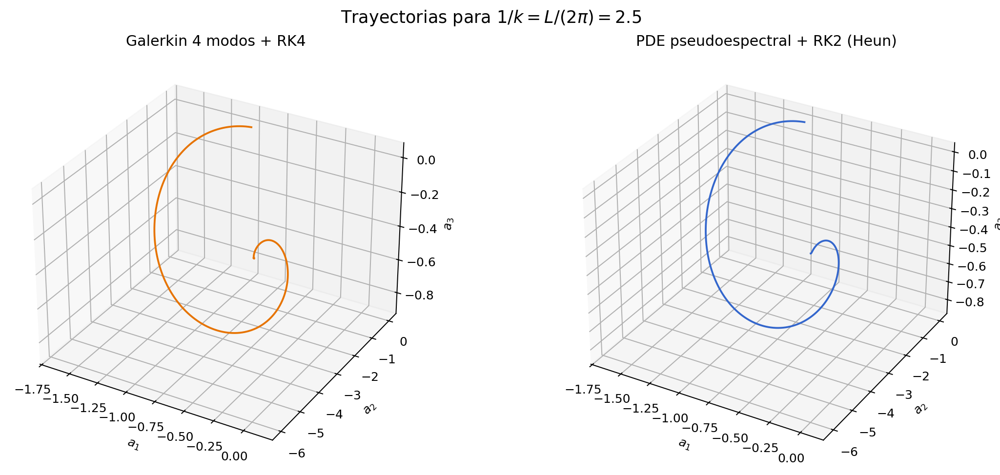

In [6]:
t, _, _, amplitudes, tm, modal = resultados["enunciado"]
fig = plt.figure(figsize=(12.5, 5.3), constrained_layout=True)
ax1 = fig.add_subplot(121, projection="3d")
ax2 = fig.add_subplot(122, projection="3d")

ax1.plot(modal[:, 0], modal[:, 1], modal[:, 2], color="#E67300", lw=1.5)
ax2.plot(amplitudes[:, 0], amplitudes[:, 1], amplitudes[:, 2],
         color="#3366CC", lw=1.5)

for ax, titulo in ((ax1, "Galerkin 4 modos + RK4"),
                   (ax2, "PDE pseudoespectral + RK2 (Heun)")):
    ax.set_xlabel(r"$a_1$")
    ax.set_ylabel(r"$a_2$")
    ax.set_zlabel(r"$a_3$")
    ax.set_title(titulo)

fig.suptitle(r"Trayectorias para $1/k=L/(2\pi)=2.5$", fontsize=14)
plt.show()


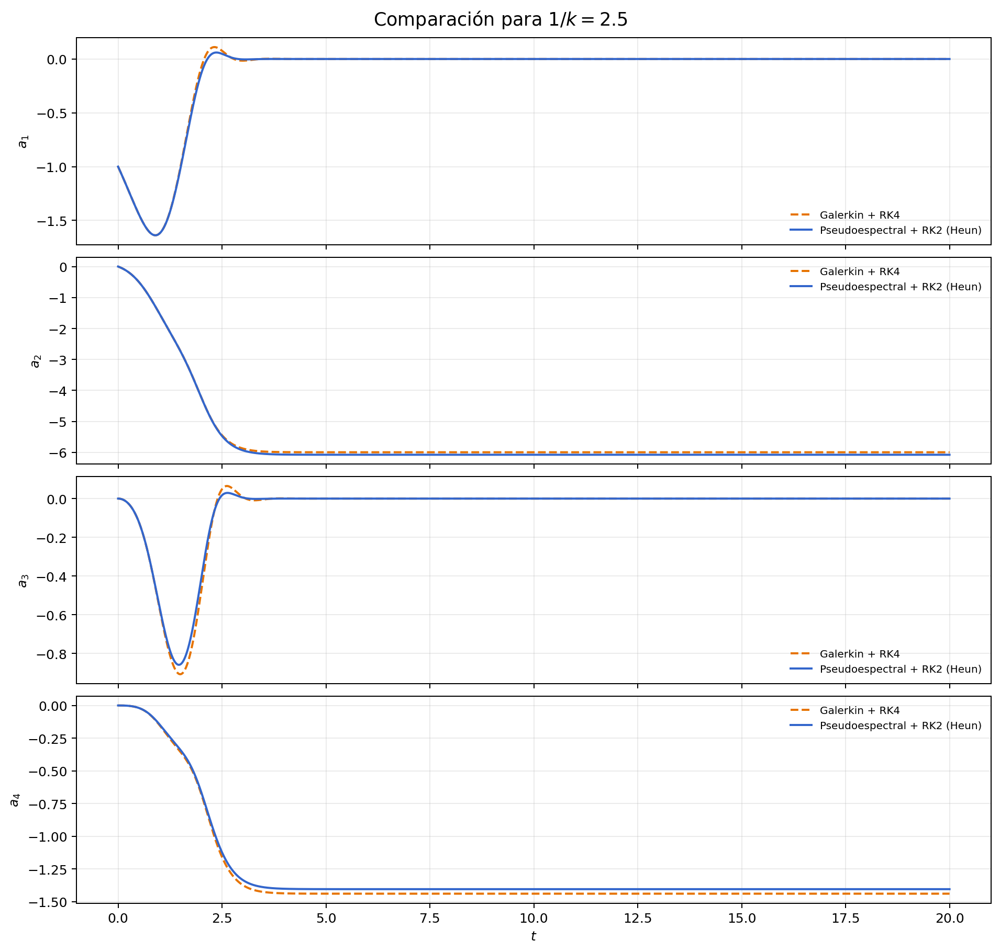

In [7]:
fig, axes = plt.subplots(4, 1, figsize=(10.5, 10.0),
                         sharex=True, constrained_layout=True)

for j, ax in enumerate(axes):
    ax.plot(tm, modal[:, j], "--", color="#E67300", lw=1.6,
            label="Galerkin + RK4")
    ax.plot(t, amplitudes[:, j], color="#3366CC", lw=1.6,
            label="Pseudoespectral + RK2 (Heun)")
    ax.set_ylabel(rf"$a_{j+1}$")
    ax.grid(alpha=0.25)
    ax.legend(frameon=False, fontsize=8)

axes[-1].set_xlabel(r"$t$")
fig.suptitle(r"Comparación para $1/k=2.5$", fontsize=14)
plt.show()


## Control con los parámetros de la pizarra

La recomendación de clase produce una comparación especialmente limpia: las curvas del truncamiento a cuatro modos y de la PDE resultan casi indistinguibles durante todo el intervalo. Esto confirma que `N_x=32` es suficiente para este caso y que cuatro modos capturan la dinámica dominante para
$$
\frac{1}{k}=1.94.
$$


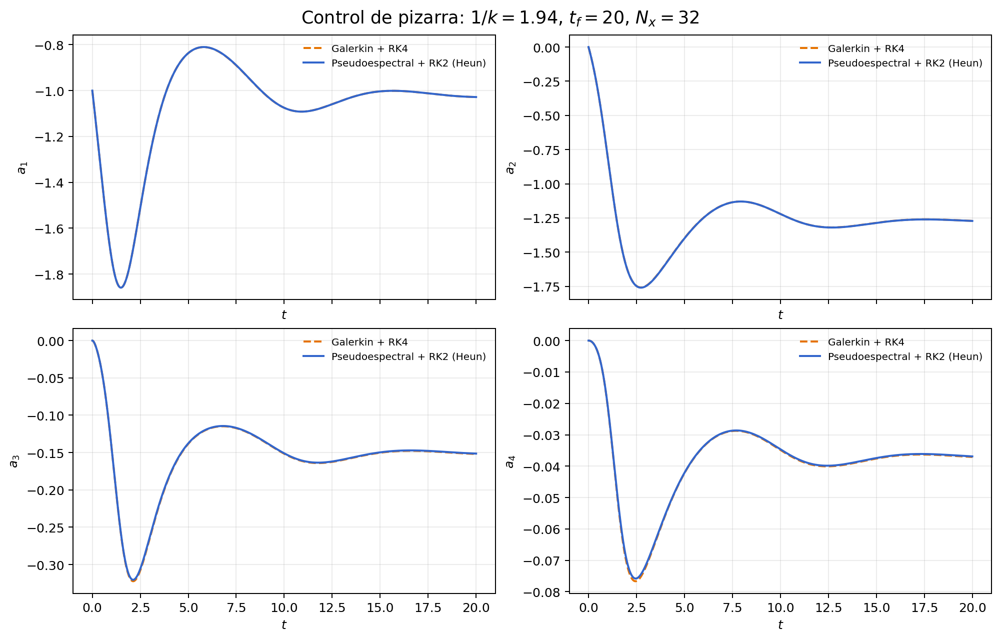

In [8]:
t2, _, _, amp2, tm2, modal2 = resultados["pizarra"]
fig, axes = plt.subplots(2, 2, figsize=(11.0, 7.0),
                         sharex=True, constrained_layout=True)

for j, ax in enumerate(axes.flat):
    ax.plot(tm2, modal2[:, j], "--", color="#E67300", lw=1.6,
            label="Galerkin + RK4")
    ax.plot(t2, amp2[:, j], color="#3366CC", lw=1.6,
            label="Pseudoespectral + RK2 (Heun)")
    ax.set_ylabel(rf"$a_{j+1}$")
    ax.set_xlabel(r"$t$")
    ax.grid(alpha=0.25)
    ax.legend(frameon=False, fontsize=8)

fig.suptitle(r"Control de pizarra: $1/k=1.94$, $t_f=20$, $N_x=32$",
             fontsize=14)
plt.show()


## Interpretación

### Caso principal: `1/k = 2.5`

Después de un transitorio breve, tanto la PDE como el modelo de cuatro modos convergen a un estado estacionario dominado por `a_2` y `a_4`. Numéricamente se obtiene aproximadamente
$$
(a_1,a_2,a_3,a_4)_{\mathrm{PDE}}
=(0,-6.0758,0,-1.4054),
$$
mientras que el truncamiento produce
$$
(a_1,a_2,a_3,a_4)_{4\,\mathrm{modos}}
=(0,-5.9952,0,-1.4400).
$$
La coincidencia cualitativa es muy buena, aunque quedan diferencias pequeñas porque la PDE conserva todos los modos superiores.

### Caso de pizarra: `1/k = 1.94`

Las cuatro amplitudes presentan oscilaciones amortiguadas. El modelo reducido y la PDE prácticamente se superponen, mostrando que los primeros cuatro modos contienen casi toda la dinámica relevante en este régimen.

Nuevamente, esta superposición no identifica RK4 con RK2. Indica que ambos integradores temporales están convergidos y que el truncamiento espacial a cuatro modos aproxima muy bien a la solución pseudoespectral.

Los controles de refinamiento dan errores del orden de
$$
3\times10^{-13}
$$
para el caso principal y
$$
2\times10^{-9}
$$
para el caso de la pizarra. Por lo tanto, las diferencias restantes entre Galerkin y la PDE no se deben a una mala elección de grilla o paso temporal, sino al truncamiento modal.



---

# 10.3 (iv) — Variación del tamaño del dominio

**Notebook de origen:** `10_3_iv_variacion_L.ipynb`

---


# 10.3 (iv) — Variación del tamaño del dominio

En este inciso resolvemos numéricamente la ecuación de Kuramoto–Sivashinsky para

$$
\frac{L}{2\pi}\in\{4.22,\,5,\,5.12,\,6.075,\,8\}.
$$

Siguiendo la indicación de clase usamos $N_x=64$, integramos hasta $t_f=15$ y partimos de

$$
u(x,0)=-\sin x.
$$

El objetivo no es solamente graficar $u(x,t)$: también elegiremos tres amplitudes de Fourier para cada valor de $L$ y observaremos si la trayectoria converge, oscila o desarrolla una dinámica aperiódica.

## 1. Ecuación reescaleada y representación espectral

En el dominio reescaleado $x\in[0,2\pi)$ la ecuación utilizada en los incisos anteriores es

$$
\partial_t u=-u\,\partial_xu-\partial_x^2u-k^2\partial_x^4u,
\qquad k=\frac{2\pi}{L}.
$$

Es útil introducir

$$
r=\frac{L}{2\pi}=\frac{1}{k}.
$$

Si $\widehat u_q$ es el coeficiente de Fourier del modo entero $q$, entonces

$$
\frac{d\widehat u_q}{dt}
=\left(q^2-k^2q^4\right)\widehat u_q
-\frac{iq}{2}\,\widehat{u^2}_q.
$$

La parte lineal se calcula multiplicando cada coeficiente por $q^2-k^2q^4$. La parte no lineal se evalúa pseudoespectralmente: se forma $u^2$ en el espacio físico, se aplica FFT y luego se multiplica por $-iq/2$. Para reducir aliasing aplicamos la regla de los dos tercios.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

VALORES = (4.22, 5.0, 5.12, 6.075, 8.0)
Nx = 64
tf = 15.0
dt = 1.0e-4


## 2. Integración temporal: RK2 de Heun

Para mantener la misma metodología que en los apuntes de FFT, avanzamos el **campo real** $u(x,t)$ con RK2 de Heun:

$$
K_1=F(u^n),
$$

$$
K_2=F\left(u^n+\Delta t\,K_1\right),
$$

$$
u^{n+1}=u^n+\frac{\Delta t}{2}(K_1+K_2).
$$

Aquí $F(u)$ es el lado derecho pseudoespectral. FFT/IFFT calculan las derivadas espaciales; RK2 integra en el tiempo. No son dos simulaciones diferentes, sino las dos partes del mismo algoritmo.

Avanzar directamente un arreglo de coeficientes complejos y descartar después la parte imaginaria de la IFFT puede dejar crecer errores que rompen la simetría conjugada. Por eso se actualiza $u$ como arreglo real, exactamente como en los apuntes.

In [2]:
def paso_rk2_heun(u, rhs, dt):
    k1 = rhs(u)
    k2 = rhs(u + dt*k1)
    return u + 0.5*dt*(k1 + k2)


def integrar_todos(valores=VALORES, Nx=Nx, tf=tf, dt=dt, muestras_maximas=2500):
    valores = np.asarray(valores, dtype=float)
    x = 2*np.pi*np.arange(Nx)/Nx
    q = np.fft.fftfreq(Nx, d=1.0/Nx)
    mascara = np.abs(q) <= Nx/3

    k = (1.0/valores)[:, None]
    operador_lineal = q[None, :]**2 - k**2*q[None, :]**4

    n_steps = int(np.ceil(tf/dt))
    dt = tf/n_steps
    guardar_cada = max(1, int(np.ceil(n_steps/muestras_maximas)))

    def rhs(u):
        u_hat = np.fft.fft(u, axis=1)
        u2_hat = np.fft.fft(u*u, axis=1)
        u2_hat[:, ~mascara] = 0.0

        rhs_hat = operador_lineal*u_hat - 0.5j*q[None, :]*u2_hat
        rhs_hat[:, ~mascara] = 0.0
        return np.fft.ifft(rhs_hat, axis=1).real

    u = np.repeat((-np.sin(x))[None, :], len(valores), axis=0)
    tiempos = [0.0]
    historia = [u.copy()]

    for n in range(1, n_steps + 1):
        u = paso_rk2_heun(u, rhs, dt)
        # La media es una cantidad conservada y vale cero para la CI elegida.
        u -= np.mean(u, axis=1, keepdims=True)
        if n % guardar_cada == 0 or n == n_steps:
            tiempos.append(n*dt)
            historia.append(u.copy())

    return np.asarray(tiempos), x, np.asarray(historia), dt


In [3]:
t, x, U, dt_usado = integrar_todos()
print(f"Integración terminada: dt={dt_usado:.1e}, {len(t)} instantes guardados.")
print("Forma del arreglo (tiempo, caso, espacio):", U.shape)


Integración terminada: dt=1.0e-04, 2501 instantes guardados.
Forma del arreglo (tiempo, caso, espacio): (2501, 5, 64)


## 3. Amplitudes seleccionadas

Para conservar la notación de Galerkin de los incisos anteriores definimos la amplitud seno del modo $n$ por

$$
a_n(t)=-\frac{2}{N_x}\operatorname{Im}\widehat u_n(t).
$$

En cada caso elegimos los tres modos con mayor valor RMS después del primer tercio de la simulación. La selección no se hace mirando un único instante, porque un modo puede cruzar transitoriamente por cero aunque sea dinámicamente importante.

In [4]:
def amplitudes_seno(u):
    u_hat = np.fft.fft(u, axis=1)
    return -2.0*u_hat[:, 1:Nx//3 + 1].imag/Nx


amplitudes = {}
modos_elegidos = {}
for j, r in enumerate(VALORES):
    a = amplitudes_seno(U[:, j, :])
    rms = np.sqrt(np.mean(a[len(a)//3:]**2, axis=0))
    modos = np.sort(np.argsort(rms)[-3:] + 1)
    amplitudes[r] = a
    modos_elegidos[r] = modos
    print(f"L/(2π)={r:5.3f}: modos {tuple(modos)}")


L/(2π)=4.220: modos (np.int64(3), np.int64(4), np.int64(5))
L/(2π)=5.000: modos (np.int64(1), np.int64(2), np.int64(4))
L/(2π)=5.120: modos (np.int64(3), np.int64(4), np.int64(6))
L/(2π)=6.075: modos (np.int64(4), np.int64(5), np.int64(6))
L/(2π)=8.000: modos (np.int64(4), np.int64(5), np.int64(6))


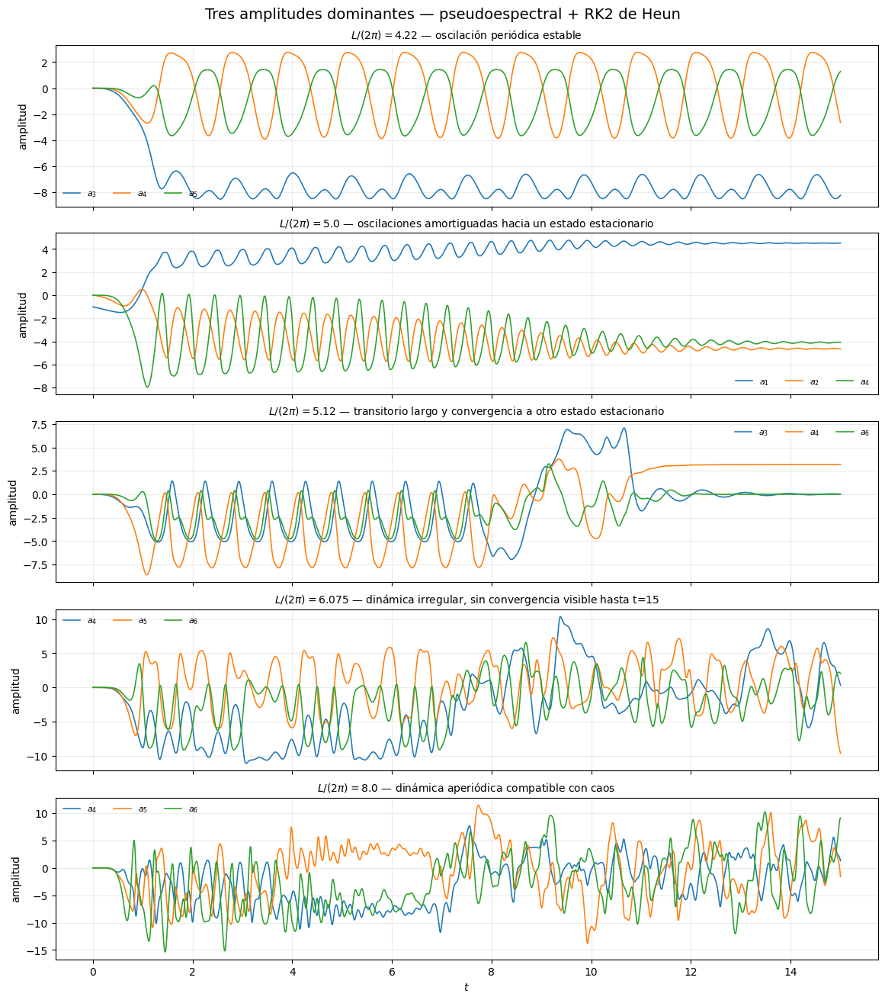

In [5]:
fig, axes = plt.subplots(5, 1, figsize=(11.5, 13), sharex=True,
                         constrained_layout=True)

descripciones = {
    4.22: "oscilación periódica estable",
    5.0: "oscilaciones amortiguadas hacia un estado estacionario",
    5.12: "transitorio largo y convergencia a otro estado estacionario",
    6.075: "dinámica irregular, sin convergencia visible hasta t=15",
    8.0: "dinámica aperiódica compatible con caos",
}

for ax, r in zip(axes, VALORES):
    a = amplitudes[r]
    for modo in modos_elegidos[r]:
        ax.plot(t, a[:, modo-1], lw=1.15, label=fr"$a_{{{modo}}}$")
    ax.set_ylabel("amplitud")
    ax.set_title(fr"$L/(2\pi)={r}$ — {descripciones[r]}", fontsize=10)
    ax.grid(alpha=0.25)
    ax.legend(frameon=False, ncol=3, fontsize=8)

axes[-1].set_xlabel(r"$t$")
fig.suptitle("Tres amplitudes dominantes — pseudoespectral + RK2 de Heun", fontsize=14)
plt.show()


### Lectura de las series temporales

- Para $L/(2\pi)=4.22$ el transitorio cae sobre una oscilación sostenida de amplitud aproximadamente constante. Esto es compatible con un ciclo límite.
- Para $L/(2\pi)=5$ las oscilaciones disminuyen lentamente y las amplitudes se acercan a constantes: la trayectoria converge a un punto fijo.
- Para $L/(2\pi)=5.12$ aparece un transitorio oscilatorio largo, una reorganización intensa cerca de $t\simeq9$ y finalmente otro estado casi estacionario.
- Para $L/(2\pi)=6.075$ las amplitudes continúan variando irregularmente y no convergen durante el intervalo simulado.
- Para $L/(2\pi)=8$ las variaciones son aún más irregulares, con múltiples escalas temporales y sin periodicidad evidente. La evidencia numérica es compatible con caos, aunque demostrar caos rigurosamente requeriría, por ejemplo, estimar un exponente de Lyapunov positivo.

La palabra “compatible” es importante: una serie irregular y una trayectoria complicada son indicios, no una demostración matemática de caos.

## 4. Diagramas espacio–tiempo

Los mapas siguientes muestran simultáneamente la estructura espacial y su evolución. Una banda que se repite regularmente indica periodicidad; bandas que se enderezan indican convergencia a un perfil estacionario; un patrón que se reorganiza sin repetición visible indica dinámica compleja.

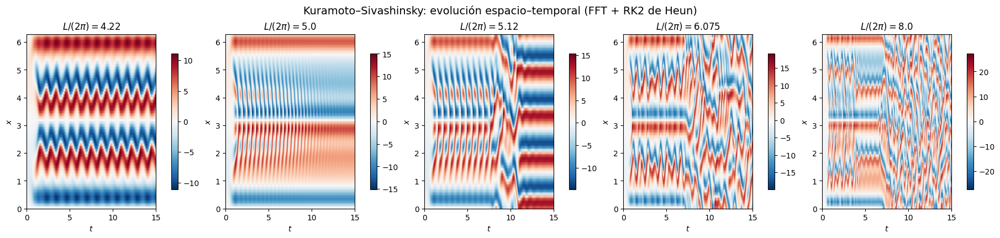

In [6]:
fig, axes = plt.subplots(1, 5, figsize=(18, 4.2), constrained_layout=True)
for j, (ax, r) in enumerate(zip(axes, VALORES)):
    im = ax.imshow(U[:, j, :].T, origin="lower", aspect="auto",
                   extent=[t[0], t[-1], x[0], 2*np.pi], cmap="RdBu_r")
    ax.set_title(fr"$L/(2\pi)={r}$")
    ax.set_xlabel(r"$t$")
    ax.set_ylabel(r"$x$")
    fig.colorbar(im, ax=ax, shrink=0.78)
fig.suptitle("Kuramoto–Sivashinsky: evolución espacio–temporal (FFT + RK2 de Heun)",
             fontsize=14)
plt.show()


## 5. Trayectorias en tres amplitudes

Proyectamos ahora cada solución sobre los tres modos seleccionados. Un punto fijo aparece como una trayectoria que termina en un punto; una oscilación periódica se aproxima a una curva cerrada; una órbita aperiódica ocupa una región más complicada del espacio de fases.

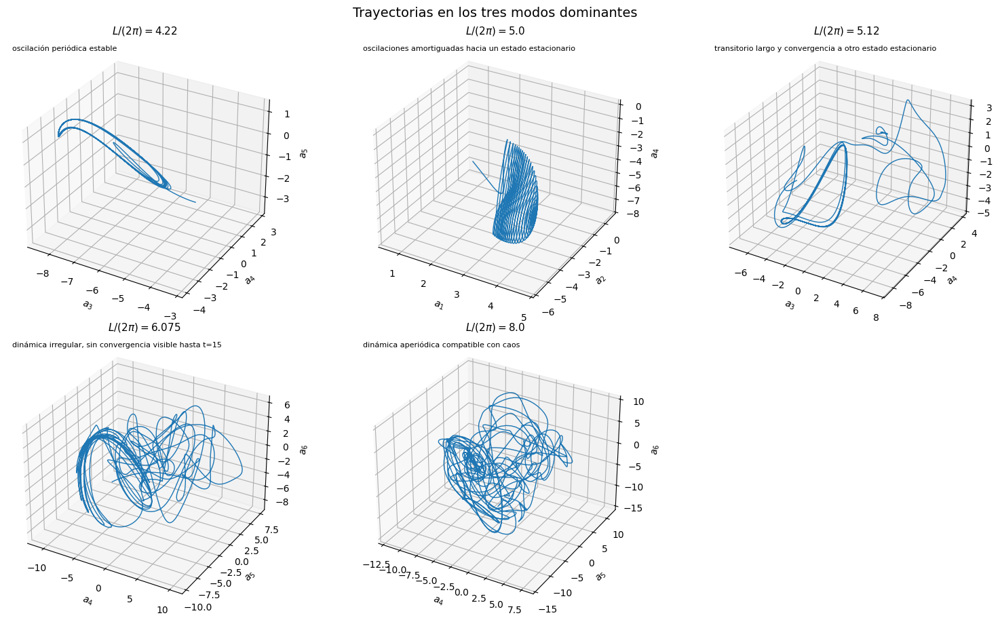

In [7]:
fig = plt.figure(figsize=(15.5, 9), constrained_layout=True)
for j, r in enumerate(VALORES):
    ax = fig.add_subplot(2, 3, j+1, projection="3d")
    a = amplitudes[r]
    m1, m2, m3 = modos_elegidos[r]
    recorte = t >= 1.0
    ax.plot(a[recorte, m1-1], a[recorte, m2-1], a[recorte, m3-1], lw=1.0)
    ax.set_xlabel(fr"$a_{{{m1}}}$")
    ax.set_ylabel(fr"$a_{{{m2}}}$")
    ax.set_zlabel(fr"$a_{{{m3}}}$")
    ax.set_title(fr"$L/(2\pi)={r}$", fontsize=11)
    ax.text2D(0.02, 0.96, descripciones[r], transform=ax.transAxes, fontsize=8)
fig.suptitle("Trayectorias en los tres modos dominantes", fontsize=14)
plt.show()


## 6. Control de estabilidad numérica

La elección de $\Delta t$ está condicionada por el modo disipativo más rígido que conserva el filtro. Para RK2 de Heun, sobre el eje real negativo, la región de estabilidad llega aproximadamente hasta

$$
-2\lesssim \lambda_q\Delta t\leq0,
$$

donde

$$
\lambda_q=q^2-k^2q^4.
$$

Con $N_x=64$ y la regla de los dos tercios, el caso más restrictivo es $L/(2\pi)=4.22$. El valor $\Delta t=10^{-4}$ queda dentro de la región estable.

Durante el desarrollo apareció además un control útil: si se avanzan los coeficientes complejos pero luego se usa solamente la parte real de la IFFT, pequeños errores pueden romper la condición de realidad

$$
\widehat u_{-q}=\widehat u_q^*.
$$

Los modos inestables amplifican esa componente espuria y producen una falsa divergencia en tiempo finito. Avanzar directamente el campo real $u$, como hacen los apuntes, mantiene la condición automáticamente y elimina esa explosión no física.

In [8]:
q = np.fft.fftfreq(Nx, d=1.0/Nx)
mascara = np.abs(q) <= Nx/3
for r in VALORES:
    lam = q**2 - (1/r)**2*q**4
    z_min = np.min(lam[mascara])*dt
    print(f"L/(2π)={r:5.3f}: min(λ_q Δt) = {z_min: .3f}")


L/(2π)=4.220: min(λ_q Δt) = -1.048
L/(2π)=5.000: min(λ_q Δt) = -0.734
L/(2π)=5.120: min(λ_q Δt) = -0.698
L/(2π)=6.075: min(λ_q Δt) = -0.483
L/(2π)=8.000: min(λ_q Δt) = -0.260


## Conclusión

Al aumentar $L$ entran más modos linealmente inestables, porque la tasa

$$
\sigma_q=q^2-k^2q^4
$$

es positiva para $0<|q|<1/k=L/(2\pi)$. Por eso la dinámica no cambia solamente de escala: aumenta el número de grados de libertad que pueden crecer y transferirse energía mediante el término no lineal.

La sucesión observada contiene oscilaciones periódicas, transitorios que terminan en estados estacionarios y, para los dominios mayores, trayectorias irregulares compatibles con dinámica caótica. Esto ilustra precisamente la transición hacia un comportamiento espacio–temporal cada vez más complejo al aumentar el tamaño del dominio.


---

# 10.3 (v) — ETDRK4, dominios grandes y animación

**Notebook de origen:** `10_3_v_ETDRK4_animacion.ipynb`

---


# 10.3 (v) — Dominios grandes, ETDRK4 y animación

El último inciso propone explorar libremente la ecuación de Kuramoto–Sivashinsky cuando el dominio es grande. Estudiaremos

$$
\frac{L}{2\pi}=10,\qquad 12,\qquad 16,
$$

con la condición inicial

$$
u(x,0)=-\sin x.
$$

Además de los mapas espacio–tiempo y los espectros, construiremos una animación comparativa de los tres campos. Para evitar el paso extremadamente pequeño exigido por RK2 explícito, introduciremos el método **ETDRK4**: Runge–Kutta exponencial de orden cuatro.

## 1. ¿Por qué cambiar el integrador temporal?

En variables reescaleadas la ecuación es

$$
\partial_tu=-u\partial_xu-\partial_x^2u-k^2\partial_x^4u,
\qquad k=\frac{2\pi}{L}.
$$

En Fourier, cada modo entero $q$ satisface

$$
\frac{d\widehat u_q}{dt}
=\underbrace{\left(q^2-k^2q^4\right)\widehat u_q}_{\text{parte lineal}}
\underbrace{-\frac{iq}{2}\widehat{u^2}_q}_{\text{parte no lineal}}.
$$

Los modos grandes tienen una tasa lineal negativa proporcional a $-q^4$. No crecen físicamente, pero hacen que un método explícito deba usar un $\Delta t$ diminuto. Al duplicar $N_x$, la restricción asociada a la cuarta derivada decrece aproximadamente por un factor $2^4=16$.

ETDRK4 evita esta limitación integrando **exactamente la parte lineal durante cada paso** y aproximando con orden cuatro la contribución no lineal. El método espacial sigue siendo pseudoespectral: solo cambia el integrador temporal.

## 2. Separación lineal–no lineal

Escribimos el sistema espectral como

$$
\dot v=\mathcal Lv+\mathcal N(v),
$$

donde $v_q=\widehat u_q$ y

$$
\mathcal L_q=q^2-\frac{q^4}{r^2},
\qquad r=\frac{L}{2\pi},
$$

$$
\mathcal N_q(v)=-\frac{iq}{2}\operatorname{FFT}\!\left[
\left(\operatorname{IFFT}v\right)^2\right]_q.
$$

La no linealidad se calcula en el espacio físico porque allí solo requiere elevar $u$ al cuadrado. Después se vuelve al espacio de Fourier. Aplicamos la regla de los dos tercios para reducir aliasing.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

CASOS = ((10.0, 128), (12.0, 128), (16.0, 256))
tf = 30.0
dt = 1.0e-3


## 3. Coeficientes de ETDRK4

Definimos

$$
E=e^{\Delta t\mathcal L},
\qquad E_2=e^{\Delta t\mathcal L/2}.
$$

Los restantes coeficientes contienen cocientes que pierden precisión cuando $\Delta t\mathcal L$ está cerca de cero. Por eso se evalúan mediante promedios sobre un pequeño contorno complejo, siguiendo la formulación numéricamente estable de ETDRK4. Esta operación se realiza una sola vez antes de integrar.

In [2]:
def coeficientes_etdrk4(lineal, dt, M=32):
    E = np.exp(dt*lineal)
    E2 = np.exp(0.5*dt*lineal)

    # Puntos sobre la mitad superior del círculo unidad.
    raices = np.exp(1j*np.pi*(np.arange(1, M + 1) - 0.5)/M)
    LR = dt*lineal[:, None] + raices[None, :]

    Q = dt*np.real(np.mean((np.exp(LR/2) - 1)/LR, axis=1))
    f1 = dt*np.real(np.mean(
        (-4 - LR + np.exp(LR)*(4 - 3*LR + LR**2))/LR**3,
        axis=1
    ))
    f2 = dt*np.real(np.mean(
        (2 + LR + np.exp(LR)*(-2 + LR))/LR**3,
        axis=1
    ))
    f3 = dt*np.real(np.mean(
        (-4 - 3*LR - LR**2 + np.exp(LR)*(4 - LR))/LR**3,
        axis=1
    ))
    return E, E2, Q, f1, f2, f3


## 4. Un paso ETDRK4

Si $N_v=\mathcal N(v_n)$, el algoritmo forma tres estados intermedios:

$$
a=E_2v_n+Q N_v,
$$

$$
b=E_2v_n+Q\mathcal N(a),
$$

$$
c=E_2a+Q\left(2\mathcal N(b)-N_v\right).
$$

La actualización final es

$$
v_{n+1}=Ev_n+f_1N_v
+2f_2\left[\mathcal N(a)+\mathcal N(b)\right]
+f_3\mathcal N(c).
$$

Los factores exponenciales incorporan exactamente la evolución lineal, incluida la fuerte disipación de los modos altos.

In [3]:
def integrar_etdrk4(r, Nx, tf=tf, dt=dt, n_frames=301, perturbacion=0.0):
    x = 2*np.pi*np.arange(Nx)/Nx
    q = np.fft.fftfreq(Nx, d=1.0/Nx)
    mascara = np.abs(q) <= Nx/3
    lineal = q**2 - q**4/r**2

    n_steps = int(np.ceil(tf/dt))
    dt = tf/n_steps
    E, E2, Q, f1, f2, f3 = coeficientes_etdrk4(lineal, dt)
    guardar_cada = max(1, int(np.ceil(n_steps/(n_frames - 1))))

    def no_lineal(v):
        u = np.fft.ifft(v).real
        u2_hat = np.fft.fft(u*u)
        u2_hat[~mascara] = 0.0
        return -0.5j*q*u2_hat

    # perturbacion permite hacer después experimentos de sensibilidad.
    u0 = -np.sin(x) + perturbacion*np.sin(2*x)
    v = np.fft.fft(u0)
    v[~mascara] = 0.0

    tiempos = [0.0]
    campos = [u0.copy()]

    for n in range(1, n_steps + 1):
        Nv = no_lineal(v)

        a = E2*v + Q*Nv
        Na = no_lineal(a)

        b = E2*v + Q*Na
        Nb = no_lineal(b)

        c = E2*a + Q*(2*Nb - Nv)
        Nc = no_lineal(c)

        v = E*v + f1*Nv + 2*f2*(Na + Nb) + f3*Nc
        v[~mascara] = 0.0
        v[0] = 0.0

        # Mantiene exactamente la simetría conjugada propia de un campo real.
        v = np.fft.fft(np.fft.ifft(v).real)

        if n % guardar_cada == 0 or n == n_steps:
            tiempos.append(n*dt)
            campos.append(np.fft.ifft(v).real)

    return np.asarray(tiempos), x, np.asarray(campos), dt


## 5. Simulaciones

Usamos $N_x=128$ para los dos primeros dominios y $N_x=256$ para el mayor. Guardar solo 301 estados reduce la memoria y es suficiente para las figuras y la animación; internamente el integrador realiza todos los pasos temporales.

In [4]:
resultados = {}

for r, Nx in CASOS:
    t, x, u, dt_usado = integrar_etdrk4(r, Nx)
    energia = 0.5*np.mean(u*u, axis=1)
    resultados[r] = {"t": t, "x": x, "u": u,
                     "energia": energia, "Nx": Nx}
    print(
        f"L/(2*pi)={r:g}, Nx={Nx}, dt={dt_usado:g}, "
        f"max|u|={np.max(np.abs(u)):.3f}"
    )


L/(2*pi)=10, Nx=128, dt=0.001, max|u|=27.907
L/(2*pi)=12, Nx=128, dt=0.001, max|u|=38.331
L/(2*pi)=16, Nx=256, dt=0.001, max|u|=54.476


## 6. Mapas espacio–tiempo

Estos mapas son la forma más directa de reconocer el caos espacio–temporal. Para dominios pequeños suelen aparecer bandas regulares o perfiles estacionarios. Aquí observamos creación, desplazamiento, interacción y desaparición irregular de estructuras.

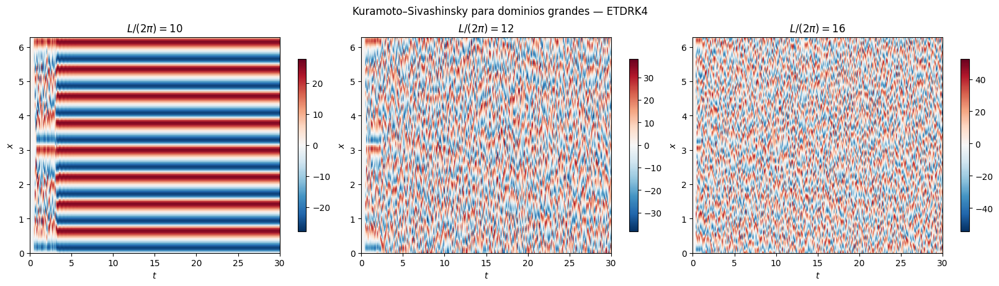

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5), constrained_layout=True)

for ax, (r, _) in zip(axes, CASOS):
    d = resultados[r]
    im = ax.imshow(d["u"].T, origin="lower", aspect="auto",
                   extent=[d["t"][0], d["t"][-1], 0, 2*np.pi],
                   cmap="RdBu_r")
    ax.set_title(fr"$L/(2\pi)={r:g}$")
    ax.set_xlabel(r"$t$")
    ax.set_ylabel(r"$x$")
    fig.colorbar(im, ax=ax, shrink=0.8)

fig.suptitle("Kuramoto–Sivashinsky para dominios grandes — ETDRK4")
plt.show()


## 7. Energía y espectro de Fourier

Definimos una medida cuadrática de la intensidad del campo:

$$
E(t)=\frac{1}{2}\left\langle u^2\right\rangle_x.
$$

No es una cantidad conservada: el término $-u_{xx}$ inyecta energía en modos largos, el término $-k^2u_{xxxx}$ disipa modos cortos y la no linealidad redistribuye energía entre escalas. En un régimen caótico esperamos fluctuaciones acotadas.

El espectro promedio

$$
P_q=\left\langle |\widehat u_q(t)|^2\right\rangle_t
$$

muestra cuántos modos participan significativamente en la dinámica.

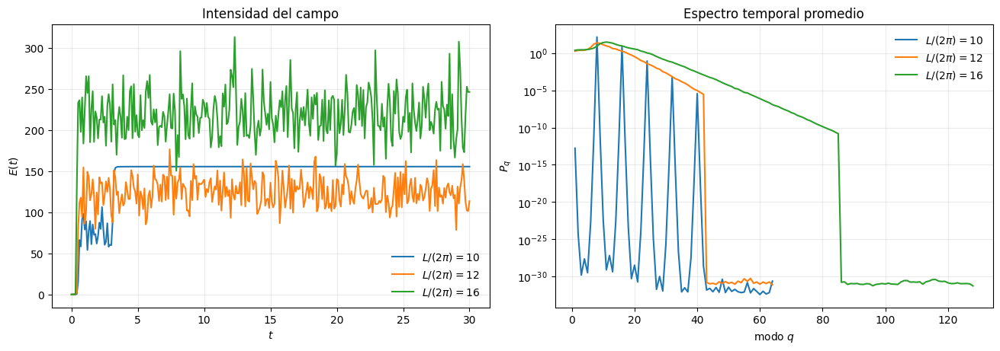

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5), constrained_layout=True)

for r, Nx in CASOS:
    d = resultados[r]
    axes[0].plot(d["t"], d["energia"], label=fr"$L/(2\pi)={r:g}$")

    u_hat = np.fft.rfft(d["u"], axis=1)/Nx
    potencia = np.mean(np.abs(u_hat[len(u_hat)//3:])**2, axis=0)
    q = np.arange(len(potencia))
    axes[1].semilogy(q[1:], potencia[1:], label=fr"$L/(2\pi)={r:g}$")

axes[0].set(xlabel=r"$t$", ylabel=r"$E(t)$", title="Intensidad del campo")
axes[1].set(xlabel=r"modo $q$", ylabel=r"$P_q$", title="Espectro temporal promedio")
for ax in axes:
    ax.grid(alpha=0.25)
    ax.legend(frameon=False)
plt.show()


## 8. Animación comparativa

La animación representa el mismo instante en los tres dominios reescaleados. El eje espacial siempre es $[0,2\pi)$; el efecto de aumentar el dominio físico aparece en el parámetro $k=2\pi/L$ y permite que más modos sean linealmente inestables.

Usamos límites verticales independientes porque la amplitud típica crece con $L$. Se muestran aproximadamente 75 cuadros para que el notebook no produzca un archivo HTML innecesariamente grande.

In [7]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4), constrained_layout=True)
lineas = []

for ax, (r, _) in zip(axes, CASOS):
    d = resultados[r]
    linea, = ax.plot(d["x"], d["u"][0], lw=1.6)
    margen = 1.08*np.max(np.abs(d["u"]))
    ax.set_xlim(0, 2*np.pi)
    ax.set_ylim(-margen, margen)
    ax.set_title(fr"$L/(2\pi)={r:g}$")
    ax.set_xlabel(r"$x$")
    ax.grid(alpha=0.2)
    lineas.append(linea)

axes[0].set_ylabel(r"$u(x,t)$")
titulo = fig.suptitle(r"$t=0$")

# Todos los resultados tienen el mismo número de cuadros guardados.
indices = np.arange(0, len(resultados[10.0]["t"]), 4)

def actualizar(indice_animacion):
    n = indices[indice_animacion]
    for linea, (r, _) in zip(lineas, CASOS):
        d = resultados[r]
        linea.set_ydata(d["u"][n])
    titulo.set_text(fr"$t={resultados[10.0]['t'][n]:.2f}$")
    return [*lineas, titulo]

animacion = FuncAnimation(
    fig, actualizar, frames=len(indices), interval=70, blit=False
)
plt.close(fig)
HTML(animacion.to_jshtml(fps=15))


## 9. Control temporal y significado de la divergencia entre trayectorias

En un problema caótico, dos simulaciones con pasos ligeramente diferentes terminan separándose aunque ambas sean numéricamente correctas. Por eso el control debe hacerse en un intervalo corto, antes de que la amplificación caótica domine.

La siguiente celda compara $\Delta t=2\times10^{-3}$ y $10^{-3}$ hasta $t=0.2$. Se usa el error relativo

$$
\varepsilon=
\frac{\|u_{\Delta t}-u_{\Delta t/2}\|_2}
{\|u_{\Delta t/2}\|_2}.
$$

Si se extendiera esta comparación hasta tiempos grandes, las soluciones puntuales dejarían de coincidir. En ese régimen deben compararse propiedades estadísticas —energía media, espectros y distribuciones—, no cada valor instantáneo de $u$.

In [8]:
_, _, u_dt, _ = integrar_etdrk4(10.0, 128, tf=0.2, dt=2e-3, n_frames=2)
_, _, u_dt2, _ = integrar_etdrk4(10.0, 128, tf=0.2, dt=1e-3, n_frames=2)

error_relativo = np.linalg.norm(u_dt[-1] - u_dt2[-1])/np.linalg.norm(u_dt2[-1])
print(f"Error relativo a t=0.2: {error_relativo:.3e}")


Error relativo a t=0.2: 2.745e-11


## 10. Experimento opcional: sensibilidad a la condición inicial

La función acepta una perturbación $\epsilon\sin(2x)$:

$$
u_0^{(1)}=-\sin x,
\qquad
u_0^{(2)}=-\sin x+\epsilon\sin(2x).
$$

Se puede ejecutar, por ejemplo, con `perturbacion=1e-8`, calcular

$$
d(t)=\|u^{(1)}(t)-u^{(2)}(t)\|_2,
$$

y graficar $\log d(t)$. Un tramo aproximadamente lineal indicaría separación exponencial. Se deja como experimento opcional porque duplica el costo de la simulación más grande.

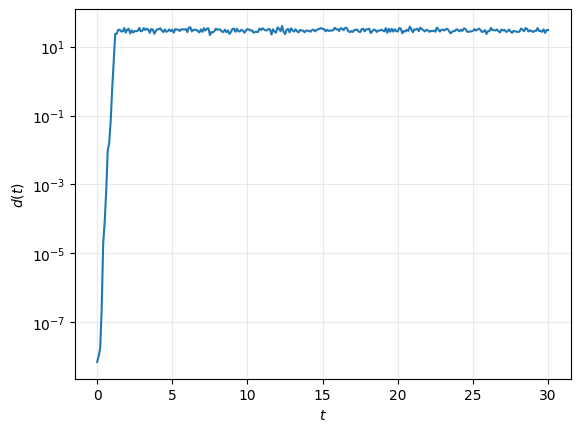

In [11]:
# Ejemplo opcional (descomentar para ejecutar):
t1, x1, u1, _ = integrar_etdrk4(16.0, 256, perturbacion=0.0)
t2, x2, u2, _ = integrar_etdrk4(16.0, 256, perturbacion=1e-8)
distancia = np.sqrt(np.mean((u1-u2)**2, axis=1))
plt.semilogy(t1, distancia)
plt.xlabel(r"$t$")
plt.ylabel(r"$d(t)$")
plt.grid(alpha=0.25)
plt.show()


## Conclusión

ETDRK4 permite explorar dominios grandes sin pagar la severa restricción de estabilidad que la derivada cuarta impone a RK2 explícito. La FFT continúa resolviendo la parte espacial y el filtro de dos tercios controla el aliasing; el cambio está únicamente en el avance temporal.

Para los tres valores estudiados aparecen patrones irregulares acotados, espectros con muchos modos activos y una complejidad espacial creciente. La animación permite ver el mecanismo físico detrás de los mapas: las estructuras nacen, se desplazan, interactúan y desaparecen sin repetirse de manera evidente, caracterizando el régimen de caos espacio–temporal de Kuramoto–Sivashinsky.

## 11. Geometría alrededor de un equilibrio: reproducción del paper

La proyección sobre tres amplitudes usada en el inciso (iv) describe una trayectoria, pero no reconstruye la geometría local del flujo. Como extensión reproducimos la idea de las Figuras 5.4 y 5.5 de [Cvitanović, Davidchack y Siminos](https://arxiv.org/pdf/0709.2944).

El paper utiliza el dominio físico $L=22$, que en nuestra notación reescaleada corresponde a

$$
r=\frac{L}{2\pi}=\frac{22}{2\pi}\simeq3.5014.
$$

El procedimiento es:

1. Encontrar un equilibrio no trivial $E_1$ con modo fundamental dominante.
2. Construir el Jacobiano del sistema espectral completo alrededor de $E_1$.
3. Calcular sus autovalores y autovectores.
4. Perturbar $E_1$ en círculos pequeños contenidos en sus dos planos inestables.
5. Integrar todas las perturbaciones con ETDRK4.
6. Proyectar las trayectorias sobre coordenadas construidas con los autovectores.

Esto es conceptualmente diferente de elegir tres modos de Fourier: las coordenadas quedan adaptadas al equilibrio y a las direcciones en las que las perturbaciones realmente crecen.

### 11.1 Representación del equilibrio y estabilidad lineal

Para fijar la fase de la simetría de traslación buscamos primero $E_1$ dentro del subespacio impar:

$$
u_{E_1}(x)=\sum_{n=1}^{N}a_n\sin(nx).
$$

Después calculamos la estabilidad en el espacio completo de senos y cosenos. Si $F(y)$ representa el lado derecho espectral y $y_{E_1}$ el vector de coeficientes del equilibrio, el Jacobiano es

$$
J_{ij}=\left.\frac{\partial F_i}{\partial y_j}\right|_{y=y_{E_1}}.
$$

El equilibrio encontrado tiene dos pares complejos inestables. En unidades de tiempo físico obtenemos

$$
\lambda_{1,2}\simeq0.1308\pm0.3341i,
$$

$$
\lambda_{3,4}\simeq0.0824\pm0.3402i,
$$

en coincidencia con los valores reportados en el artículo. La parte real positiva produce el alejamiento de $E_1$ y la parte imaginaria produce la rotación espiralada.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import root
from pathlib import Path


def estado_a_campo(y, x, N):
    c, s = y[:N], y[N:]
    n = np.arange(1, N + 1)[:, None]
    return c @ np.cos(n*x[None, :]) + s @ np.sin(n*x[None, :])


def campo_a_estado(u, N):
    Nx = u.size
    h = np.fft.fft(u)
    c = 2*h[1:N+1].real/Nx
    s = -2*h[1:N+1].imag/Nx
    return np.r_[c, s]


def rhs_estado(y, r, x, q, N):
    u = estado_a_campo(y, x, N)
    h = np.fft.fft(u)
    rhs_h = (q*q-q**4/r**2)*h - 0.5j*q*np.fft.fft(u*u)
    return campo_a_estado(np.fft.ifft(rhs_h).real, N)


def equilibrio_E1(r_final=22/(2*np.pi), N=16, Nx=128):
    x = 2*np.pi*np.arange(Nx)/Nx
    q = np.fft.fftfreq(Nx, d=1/Nx)
    r0 = 1.03
    lam1 = 1-r0**-2
    lam2 = 4-16/r0**2
    a2 = -2*lam1
    a1 = np.sqrt(max(1e-8, -4*lam1*lam2))
    s = np.zeros(N)
    s[0] = a1
    s[1] = a2

    def rhs_senos(senos, r):
        y = np.r_[np.zeros(N), senos]
        return rhs_estado(y, r, x, q, N)[N:]

    for r in np.linspace(r0, min(r_final, 1.95), 180):
        sol = root(lambda z: rhs_senos(z, r), s, method="hybr",
                   options={"xtol": 1e-11, "maxfev": 5000})
        if not sol.success:
            sol = root(lambda z: rhs_senos(z, r), s, method="lm",
                       options={"ftol": 1e-13, "xtol": 1e-13, "maxiter": 5000})
        s = sol.x
        if np.linalg.norm(s) < 1e-5:
            raise RuntimeError(f"La continuación cayó en cero para r={r}")
    # En el parámetro final usamos varias fases/amplitudes iniciales sesgadas
    # hacia el modo 1 y conservamos la raíz cuyo modo fundamental domina.
    candidatos = []
    semillas = [s]
    rng = np.random.default_rng(1234)
    for amp in (2.0, 3.0, 4.0, 5.0, 6.0, 8.0):
        for _ in range(5):
            z = 0.35*rng.normal(size=N)
            z *= np.exp(-0.35*np.arange(N))
            z[0] += amp*rng.choice((-1.0, 1.0))
            semillas.append(z)

    for semilla in semillas:
        sol = root(lambda z: rhs_senos(z, r_final), semilla, method="lm",
                   options={"ftol": 1e-13, "xtol": 1e-13, "maxiter": 8000})
        z = sol.x
        residuo = np.linalg.norm(rhs_senos(z, r_final))
        if residuo < 1e-7 and np.linalg.norm(z) > 1e-4:
            if not any(np.linalg.norm(z-c) < 1e-4 or np.linalg.norm(z+c) < 1e-4
                       for c in candidatos):
                candidatos.append(z)

    if not candidatos:
        raise RuntimeError("No se encontraron equilibrios no triviales")
    candidatos.sort(key=lambda z: abs(z[0])/(np.linalg.norm(z)+1e-15), reverse=True)
    s = candidatos[0]
    if abs(s[0]) < max(abs(s[1:])):
        raise RuntimeError("No se encontró una raíz con modo 1 dominante")
    return np.r_[np.zeros(N), s], x, q


def jacobiano_fd(fun, y, h=2e-7):
    J = np.empty((y.size, y.size))
    for j in range(y.size):
        paso = h*(1+abs(y[j]))
        yp = y.copy(); yp[j] += paso
        ym = y.copy(); ym[j] -= paso
        J[:, j] = (fun(yp)-fun(ym))/(2*paso)
    return J


def coeficientes_etdrk4(lineal, dt, M=32):
    E = np.exp(dt*lineal)
    E2 = np.exp(0.5*dt*lineal)
    rr = np.exp(1j*np.pi*(np.arange(1, M+1)-0.5)/M)
    LR = dt*lineal[:, None] + rr[None, :]
    Q = dt*np.real(np.mean((np.exp(LR/2)-1)/LR, axis=1))
    f1 = dt*np.real(np.mean((-4-LR+np.exp(LR)*(4-3*LR+LR**2))/LR**3, axis=1))
    f2 = dt*np.real(np.mean((2+LR+np.exp(LR)*(-2+LR))/LR**3, axis=1))
    f3 = dt*np.real(np.mean((-4-3*LR-LR**2+np.exp(LR)*(4-LR))/LR**3, axis=1))
    return E, E2, Q, f1, f2, f3


def integrar_familia(yE, par, r, x, q, N, tf_fisico=70, dt=1e-3,
                     n_orbitas=28, n_frames=180, eps=2e-3):
    """Familia circular de perturbaciones en un auto-plano inestable."""
    Nx = x.size
    lineal = q*q-q**4/r**2
    mascara = np.abs(q) <= Nx/3
    tf = tf_fisico/r**2
    n_steps = int(np.ceil(tf/dt))
    dt = tf/n_steps
    E, E2, Q, f1, f2, f3 = coeficientes_etdrk4(lineal, dt)
    cada = max(1, int(np.ceil(n_steps/(n_frames-1))))

    p1 = par.real/np.linalg.norm(par.real)
    p2 = par.imag-p1*np.dot(p1, par.imag)
    p2 /= np.linalg.norm(p2)
    angulos = np.linspace(0, 2*np.pi, n_orbitas, endpoint=False)
    ys = np.array([yE+eps*(np.cos(a)*p1+np.sin(a)*p2) for a in angulos])
    campos0 = np.array([estado_a_campo(y, x, N) for y in ys])
    v = np.fft.fft(campos0, axis=1)

    def NL(z):
        u = np.fft.ifft(z, axis=1).real
        h2 = np.fft.fft(u*u, axis=1)
        h2[:, ~mascara] = 0
        return -0.5j*q[None, :]*h2

    tiempos = [0.0]
    historia = [campos0]
    for n in range(1, n_steps+1):
        Nv = NL(v)
        a = E2[None, :]*v+Q[None, :]*Nv
        Na = NL(a)
        b = E2[None, :]*v+Q[None, :]*Na
        Nb = NL(b)
        c = E2[None, :]*a+Q[None, :]*(2*Nb-Nv)
        Nc = NL(c)
        v = E[None, :]*v+f1[None, :]*Nv+2*f2[None, :]*(Na+Nb)+f3[None, :]*Nc
        v[:, ~mascara] = 0
        v[:, 0] = 0
        v = np.fft.fft(np.fft.ifft(v, axis=1).real, axis=1)
        if n % cada == 0 or n == n_steps:
            tiempos.append(n*dt*r**2)
            historia.append(np.fft.ifft(v, axis=1).real)
    return np.asarray(tiempos), np.asarray(historia), angulos


def proyectar_historia(historia, yE, base, N):
    nt, no, _ = historia.shape
    coords = np.empty((nt, no, 3))
    for it in range(nt):
        for io in range(no):
            y = campo_a_estado(historia[it, io], N)
            coords[it, io] = (y-yE) @ base
    return coords


def figura_variedades(yE, J, r, x, q, N, destino=None):
    valores, vectores = np.linalg.eig(J)
    positivos = [i for i in np.argsort(valores.real)[::-1]
                 if valores[i].imag > 1e-6 and valores[i].real > 0]
    estable = next(i for i in np.argsort(valores.real)[::-1]
                   if valores[i].imag > 1e-6 and valores[i].real < -1e-3)

    datos = []
    for numero, ipar in enumerate(positivos[:2]):
        par = vectores[:, ipar]
        B, _ = np.linalg.qr(np.column_stack((par.real, par.imag, vectores[:, estable].real)))
        t, hist, ang = integrar_familia(
            yE, par, r, x, q, N,
            tf_fisico=70 if numero == 0 else 210,
            n_frames=180 if numero == 0 else 300,
        )
        coords = proyectar_historia(hist, yE, B, N)
        datos.append((t, hist, coords, valores[ipar]/r**2))

    fig = plt.figure(figsize=(16, 9), constrained_layout=True)
    gs = fig.add_gridspec(2, 4, width_ratios=[2.2, 1, 1, 1])
    colores = ("#20a44b", "#e53935", "#2962ff")
    etiquetas = ("A", "B", "C")
    elegidas = ((5, 18), (4, 13, 22))
    X = r*(x-np.pi)

    for fila, (t, hist, coords, lam) in enumerate(datos):
        ax = fig.add_subplot(gs[fila, 0], projection="3d")
        for j in range(coords.shape[1]):
            ax.plot(coords[:, j, 0], coords[:, j, 1], coords[:, j, 2],
                    color="0.65", lw=0.55, alpha=0.75)
        for color, et, j in zip(colores, etiquetas, elegidas[fila]):
            ax.plot(coords[:, j, 0], coords[:, j, 1], coords[:, j, 2],
                    color=color, lw=2.0, label=f"Órbita {et}")
        ax.scatter([0], [0], [0], c="k", s=28, label=r"$E_1$")
        ax.set_xlabel(r"$v_1$"); ax.set_ylabel(r"$v_2$"); ax.set_zlabel(r"$v_3$")
        ax.set_title("Primer plano inestable" if fila == 0 else "Segundo plano inestable")
        ax.text2D(0.02, 0.95, rf"$\lambda={lam.real:.4f}\pm {abs(lam.imag):.4f}i$ (tiempo físico)",
                  transform=ax.transAxes, fontsize=9)
        ax.legend(frameon=False, fontsize=8, loc="lower left")

        for col in range(3):
            axh = fig.add_subplot(gs[fila, col+1])
            if col < len(elegidas[fila]):
                j = elegidas[fila][col]
                im = axh.imshow(hist[:, j, :].T, origin="lower", aspect="auto",
                                extent=[t[0], t[-1], X[0], X[-1]], cmap="turbo")
                axh.set_title(f"Órbita {etiquetas[col]}", color=colores[col])
                axh.set_xlabel(r"$t$")
                axh.set_ylabel(r"$x$")
            else:
                axh.axis("off")
    fig.suptitle(r"Variedades inestables de $E_1$: reproducción inspirada en Cvitanović et al.", fontsize=14)
    if destino is not None:
        fig.savefig(destino, dpi=180, bbox_inches="tight")
    plt.show()
    return valores, datos




### 11.2 Construcción de la variedad inestable

Para cada autovector complejo $e=p_1+ip_2$ elegimos condiciones iniciales

$$
y(0;\theta)=y_{E_1}+\varepsilon
\left(p_1\cos\theta+p_2\sin\theta\right),
\qquad0\leq\theta<2\pi.
$$

Cada valor de $\theta$ genera una trayectoria distinta. Su unión aproxima la variedad inestable bidimensional asociada al par de autovalores.

Los ejes $v_1,v_2,v_3$ se construyen ortonormalizando las partes real e imaginaria del autovector inestable y una dirección estable. Las líneas grises representan toda la familia; A, B y C son órbitas particulares cuya evolución espacio–temporal se muestra a la derecha.

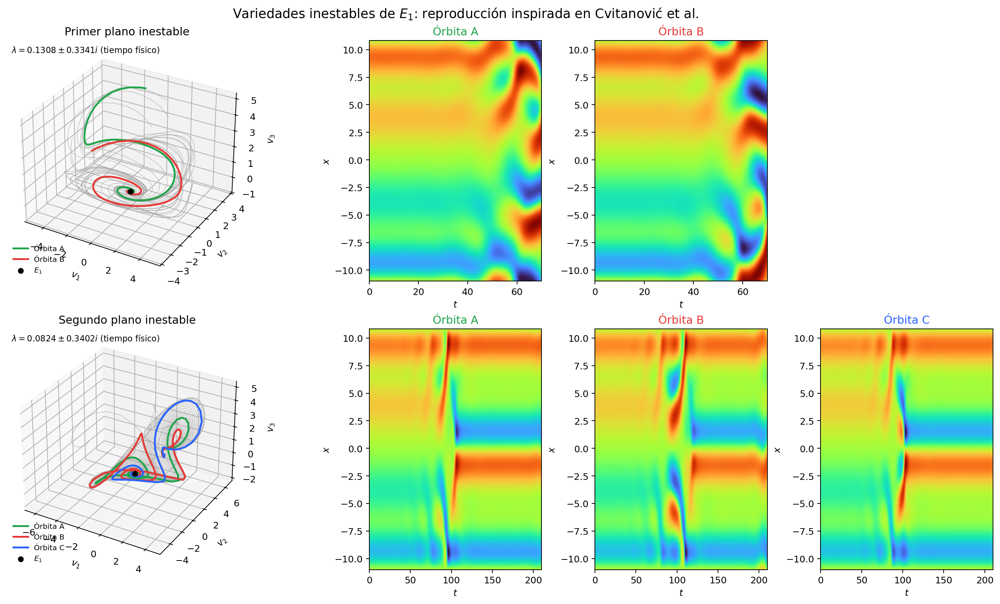

In [ ]:
r_paper = 22/(2*np.pi)
N_paper = 16

y_E1, x_paper, q_paper = equilibrio_E1(r_paper, N_paper, Nx=128)
residuo_E1 = np.linalg.norm(
    rhs_estado(y_E1, r_paper, x_paper, q_paper, N_paper)
)
J_E1 = jacobiano_fd(
    lambda y: rhs_estado(y, r_paper, x_paper, q_paper, N_paper),
    y_E1
)

autovalores_E1 = np.linalg.eigvals(J_E1)/r_paper**2
inestables = sorted(
    [z for z in autovalores_E1 if z.real > 1e-6 and z.imag > 1e-6],
    key=lambda z: z.real,
    reverse=True,
)

print(f"Residuo del equilibrio: {residuo_E1:.3e}")
for j, z in enumerate(inestables[:2], start=1):
    print(f"Par inestable {j}: {z.real:.4f} ± {abs(z.imag):.4f} i")

_ = figura_variedades(y_E1, J_E1, r_paper, x_paper, q_paper, N_paper)


### 11.3 Interpretación

- **Primer plano inestable:** las perturbaciones giran y crecen alrededor de $E_1$. Cerca de $t\simeq50$ las trayectorias abandonan el régimen lineal y entran en una región de dinámica compleja.
- **Segundo plano inestable:** el crecimiento es más lento. Las trayectorias permanecen cerca de $E_1$ durante más tiempo y alrededor de $t\simeq100$ se reorganizan hacia otro perfil estacionario, análogo al equilibrio $E_2$ del paper.
- Los mapas de color muestran las mismas curvas tridimensionales como campos $u(x,t)$. Así se conecta la geometría abstracta del espacio de estados con la evolución física del campo.

La superficie gris no es el atractor completo: es una aproximación a una variedad inestable local continuada por integración. Esta estructura actúa como parte del “esqueleto” que organiza las trayectorias caóticas.